In [1]:
# BAGIAN PEMBELAJARAN

# Import library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
import pickle as pk


In [36]:
# Load dataset
data = pd.read_csv('merged_data.csv',encoding='cp1252',low_memory=False)

In [37]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1259782 entries, 0 to 1259781
Data columns (total 85 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Flow ID                       971180 non-null  object 
 1    Source IP                    971180 non-null  object 
 2    Source Port                  971180 non-null  float64
 3    Destination IP               971180 non-null  object 
 4    Destination Port             971180 non-null  float64
 5    Protocol                     971180 non-null  float64
 6    Timestamp                    971180 non-null  object 
 7    Flow Duration                971180 non-null  float64
 8    Total Fwd Packets            971180 non-null  float64
 9    Total Backward Packets       971180 non-null  float64
 10  Total Length of Fwd Packets   971180 non-null  float64
 11   Total Length of Bwd Packets  971180 non-null  float64
 12   Fwd Packet Length Max        971180 non-n

In [38]:
data1 = data.drop(['Flow ID', ' Source IP', ' Timestamp', ' Destination IP'], axis=1)

In [39]:
data1.head(10)

,Source Port,Destination Port,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,443.0,54865.0,6.0,3.0,2.0,0.0,12.0,0.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
1,80.0,55054.0,6.0,109.0,1.0,1.0,6.0,6.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
2,80.0,55055.0,6.0,52.0,1.0,1.0,6.0,6.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
3,443.0,46236.0,6.0,34.0,1.0,1.0,6.0,6.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
4,443.0,54863.0,6.0,3.0,2.0,0.0,12.0,0.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
5,443.0,54871.0,6.0,1022.0,2.0,0.0,12.0,0.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
6,443.0,54925.0,6.0,4.0,2.0,0.0,12.0,0.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
7,443.0,54925.0,6.0,42.0,1.0,1.0,6.0,6.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
8,443.0,9282.0,6.0,4.0,2.0,0.0,12.0,0.0,6.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
9,443.0,55153.0,6.0,4.0,2.0,0.0,37.0,0.0,31.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN


In [40]:
shuffle = data1.sample(frac=1,random_state=1).reset_index()
shuffle.head(10)

,index,Source Port,Destination Port,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,771990,443.0,52917.0,6.0,9.0,1.0,1.0,0.0,0.0,0.0,...,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
1,27914,51678.0,80.0,6.0,540361.0,3.0,6.0,26.0,11601.0,20.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DDoS
2,1024258,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,135641,32202.0,80.0,6.0,2076954.0,5.0,0.0,30.0,0.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DDoS
4,250515,60670.0,80.0,6.0,49748.0,3.0,4.0,441.0,860.0,441.0,...,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
5,388453,59262.0,5555.0,6.0,48.0,1.0,1.0,0.0,6.0,0.0,...,40.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PortScan
6,1242412,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,190027,50585.0,80.0,6.0,511270.0,3.0,5.0,26.0,11601.0,20.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DDoS
8,1037849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,267462,50832.0,443.0,6.0,3.0,2.0,0.0,12.0,0.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN


In [41]:
data2 = shuffle.replace([np.inf, -np.inf], np.nan)
data2 = data2.dropna()
data2.head(10)

,index,Source Port,Destination Port,Protocol,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,...,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,771990,443.0,52917.0,6.0,9.0,1.0,1.0,0.0,0.0,0.0,...,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
1,27914,51678.0,80.0,6.0,540361.0,3.0,6.0,26.0,11601.0,20.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DDoS
3,135641,32202.0,80.0,6.0,2076954.0,5.0,0.0,30.0,0.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DDoS
4,250515,60670.0,80.0,6.0,49748.0,3.0,4.0,441.0,860.0,441.0,...,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
5,388453,59262.0,5555.0,6.0,48.0,1.0,1.0,0.0,6.0,0.0,...,40.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PortScan
7,190027,50585.0,80.0,6.0,511270.0,3.0,5.0,26.0,11601.0,20.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,DDoS
9,267462,50832.0,443.0,6.0,3.0,2.0,0.0,12.0,0.0,6.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,BENIGN
10,88048,80.0,63813.0,6.0,82645456.0,6.0,9.0,11613.0,62.0,7215.0,...,20.0,2188884.0,0.0,2188884.0,2188884.0,80400000.0,0.0,80400000.0,80400000.0,BENIGN
11,419528,41120.0,1213.0,6.0,14.0,1.0,1.0,0.0,6.0,0.0,...,40.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PortScan
15,608265,59065.0,443.0,6.0,11578002.0,9.0,10.0,925.0,1493.0,664.0,...,32.0,600175.0,0.0,600175.0,600175.0,9959902.0,0.0,9959902.0,9959902.0,BENIGN


In [42]:
#datatest = pd.DataFrame(data2).to_csv('datatest.csv')

X = data2.drop(' Label', axis=1)
y = data2[' Label']

print(Counter(y))

Counter({'BENIGN': 681388, 'PortScan': 158804, 'DDoS': 128025, 'Web Attack â€“ Brute Force': 1507, 'Web Attack â€“ XSS': 652, 'Infiltration': 36, 'Web Attack â€“ Sql Injection': 21})


In [43]:
#=========================================================
# Tidak digunakan sementara karena menggunakan class_weight
#=========================================================

rus = RandomUnderSampler() 

xData,yData = rus.fit_resample(X,y)

print(Counter(yData))
print(len(xData))

Counter({'BENIGN': 21, 'DDoS': 21, 'Infiltration': 21, 'PortScan': 21, 'Web Attack â€“ Brute Force': 21, 'Web Attack â€“ Sql Injection': 21, 'Web Attack â€“ XSS': 21})
147


In [44]:
# Training pertama untuk menentukan feature importance dari algoritma decision tree
model = RandomForestClassifier()

model.fit(xData, yData)

RandomForestClassifier()

In [45]:
importance_scores = model.feature_importances_
importance_scores

array([1.40469351e-01, 2.40628606e-02, 2.35142391e-02, 1.38914664e-03,
       2.28721048e-02, 1.10169234e-02, 9.69093946e-03, 3.26702988e-02,
       1.37375894e-02, 2.65111046e-02, 2.83015997e-03, 1.07744658e-02,
       1.73693045e-02, 1.60574246e-02, 1.73721804e-02, 1.66134448e-02,
       1.01389350e-02, 1.84135003e-02, 1.31252620e-02, 1.34983593e-02,
       1.78921429e-02, 2.20863090e-02, 9.60553492e-03, 2.27647177e-02,
       2.29931151e-02, 1.54704894e-02, 2.01078948e-02, 2.91279633e-02,
       7.77255040e-03, 5.29265554e-03, 1.88277632e-03, 1.44864304e-02,
       2.12037998e-03, 9.28532756e-05, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 7.50777950e-03, 1.01303896e-02, 1.54962774e-02,
       2.22745207e-02, 3.73610226e-03, 1.39365762e-02, 2.67440639e-02,
       1.11348832e-02, 1.68142455e-02, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 4.99532604e-03, 2.80785735e-03, 5.40144971e-03,
       0.00000000e+00, 0.00000000e+00, 2.09957089e-03, 1.79289830e-02,
      

In [46]:
feature_indices = np.argsort(importance_scores)[::-1]
feature_indices

array([ 0, 70,  7, 27, 43,  9, 72, 66,  1,  2, 24,  4, 23, 40, 21, 26, 69,
       17, 55, 20, 56, 14, 12, 45, 71, 15, 13, 39, 25, 31, 42,  8, 65, 19,
       18, 57, 44,  5, 11, 58, 16, 38, 67,  6, 22, 28, 37, 68, 51, 29, 49,
       41, 79, 10, 50, 32, 54, 30, 74,  3, 73, 76, 77, 75, 80, 33, 78, 34,
       35, 36, 46, 47, 48, 52, 53, 59, 60, 61, 62, 63, 64], dtype=int64)

In [47]:
num_top_features = 77  # Jumlah fitur yang ingin digunakan
selected_feature_indices = feature_indices[:num_top_features]
selected_feature_indices

array([ 0, 70,  7, 27, 43,  9, 72, 66,  1,  2, 24,  4, 23, 40, 21, 26, 69,
       17, 55, 20, 56, 14, 12, 45, 71, 15, 13, 39, 25, 31, 42,  8, 65, 19,
       18, 57, 44,  5, 11, 58, 16, 38, 67,  6, 22, 28, 37, 68, 51, 29, 49,
       41, 79, 10, 50, 32, 54, 30, 74,  3, 73, 76, 77, 75, 80, 33, 78, 34,
       35, 36, 46, 47, 48, 52, 53, 59, 60], dtype=int64)

In [48]:
selected_features = xData.iloc[:, selected_feature_indices] # Pemindahan variabel untuk menggunakan fitur yang telah dipilih

In [49]:
#Train test split
SF_train, SF_test, y_train, y_test = train_test_split(selected_features, yData, test_size=0.3, random_state=42)
# Penentuan nilai beban kelas
class_weights = {
    'PortScan': 1.0,
    'DDoS': 1.2,
    'Infiltration' : 8333.4,
    'Web Attack â€“ Brute Force' : 200.0,
    'Web Attack â€“ Sql Injection' : 14285.8,
    Web Attack â€“ XSS'  : 4615.4,
    'BENIGN': 0.2
}

new_model = RandomForestClassifier(max_depth=6, random_state=0, n_estimators=100, 
                                   criterion='entropy', class_weight=class_weights) #max_depth=6, random_state=0, n_estimators=6
new_model.fit(SF_train, y_train)

# Prediksi data, data training juga diprediksi untuk mengecek jika mengalami overfitting atau tidak pada prediksi data test
pred_test = new_model.predict(SF_test)
pred_train = new_model.predict(SF_train)

# Akurasi model
testaccuracy = accuracy_score(y_test, pred_test)
trainaccuracy = accuracy_score(y_train, pred_train)

# print test
print("Test Accuracy: {:.2f}%".format(testaccuracy*100))
print(classification_report(y_test, pred_test))
#print train
print("\nTrain Accuracy: {:.2f}%".format(trainaccuracy*100))
print(classification_report(y_train, pred_train))

#prediction = pd.DataFrame(pred_test, columns=[' Label']).to_csv('prediction.csv')

# Penyimpanan model untuk digunakan pada postprocessing
filename = 'recentmodel.sav'
pk.dump(model, open(filename, 'wb'))

Test Accuracy: 86.67%
                              precision    recall  f1-score   support

                      BENIGN       1.00      0.50      0.67         8
                        DDoS       1.00      1.00      1.00         7
                Infiltration       0.71      1.00      0.83         5
                    PortScan       0.88      1.00      0.93         7
  Web Attack â€“ Brute Force       0.67      0.67      0.67         3
Web Attack â€“ Sql Injection       1.00      1.00      1.00         6
          Web Attack â€“ XSS       0.80      0.89      0.84         9

                    accuracy                           0.87        45
                   macro avg       0.87      0.87      0.85        45
                weighted avg       0.89      0.87      0.86        45


Train Accuracy: 98.04%
                              precision    recall  f1-score   support

                      BENIGN       1.00      1.00      1.00        13
                        DDoS       1.00 

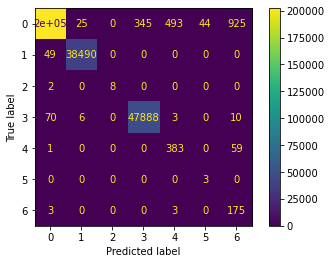

In [32]:
# Confusion matrix
cm = confusion_matrix(y_test, pred_test)

ConfusionMatrixDisplay(confusion_matrix=cm).plot();

DecisionTreeClassifier(max_features='auto', random_state=1748389919)


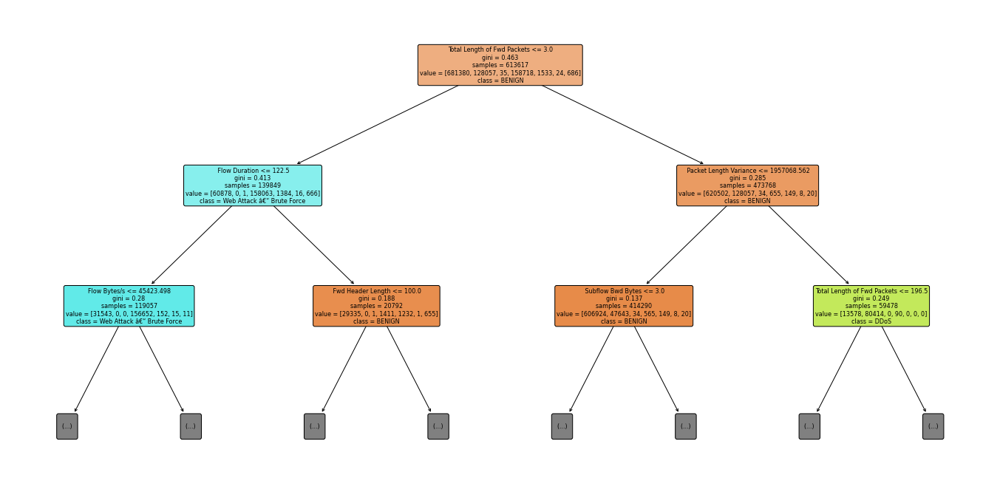

DecisionTreeClassifier(max_features='auto', random_state=406095886)


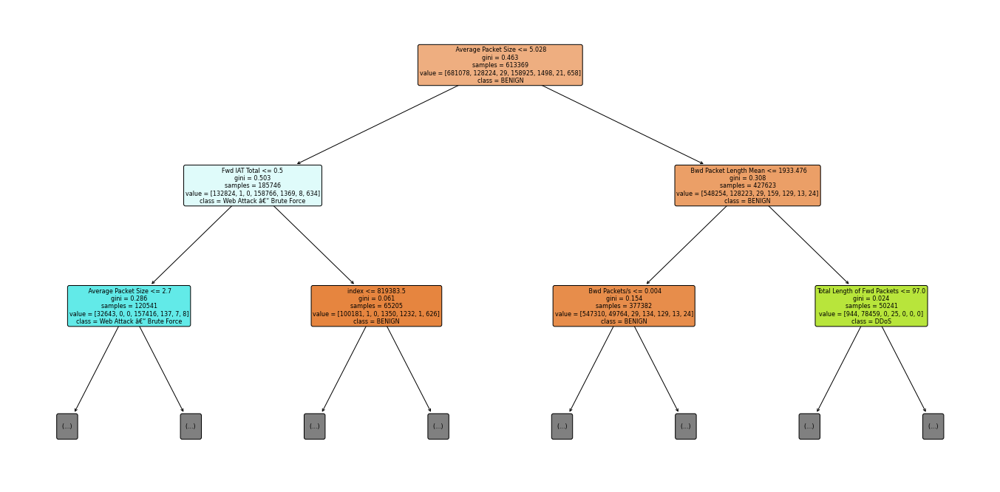

DecisionTreeClassifier(max_features='auto', random_state=2061927822)


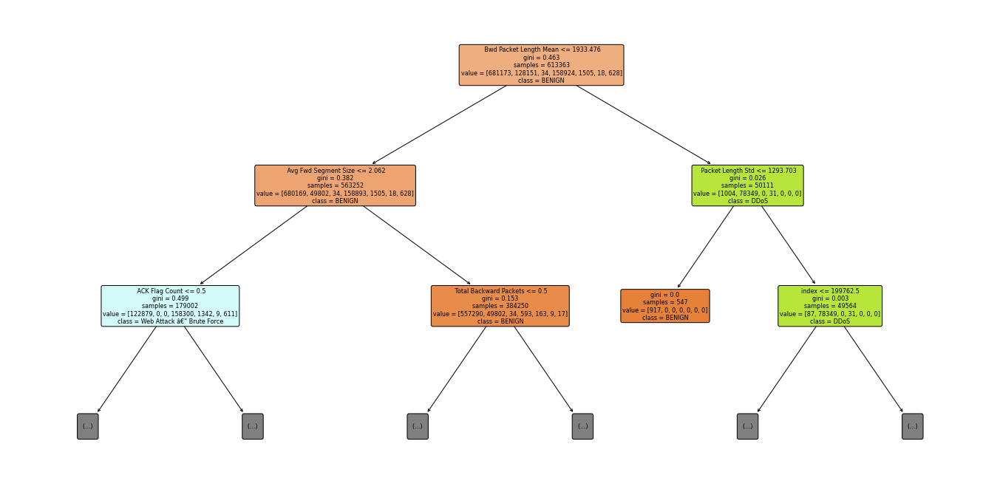

DecisionTreeClassifier(max_features='auto', random_state=1662161317)


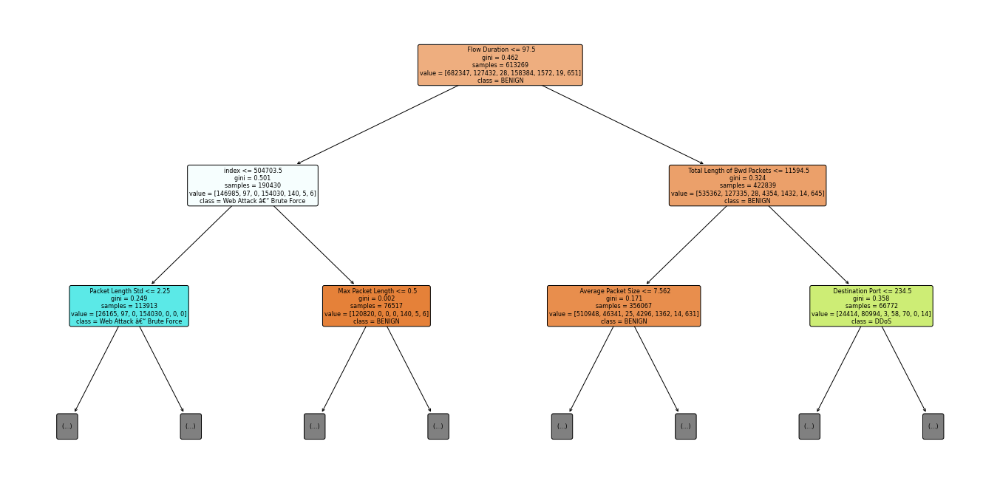

DecisionTreeClassifier(max_features='auto', random_state=507031826)


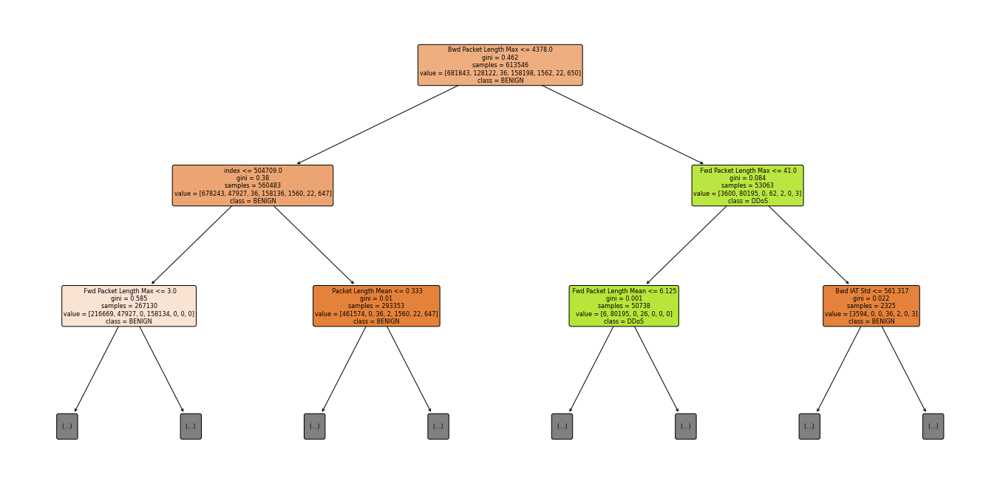

DecisionTreeClassifier(max_features='auto', random_state=1585815536)


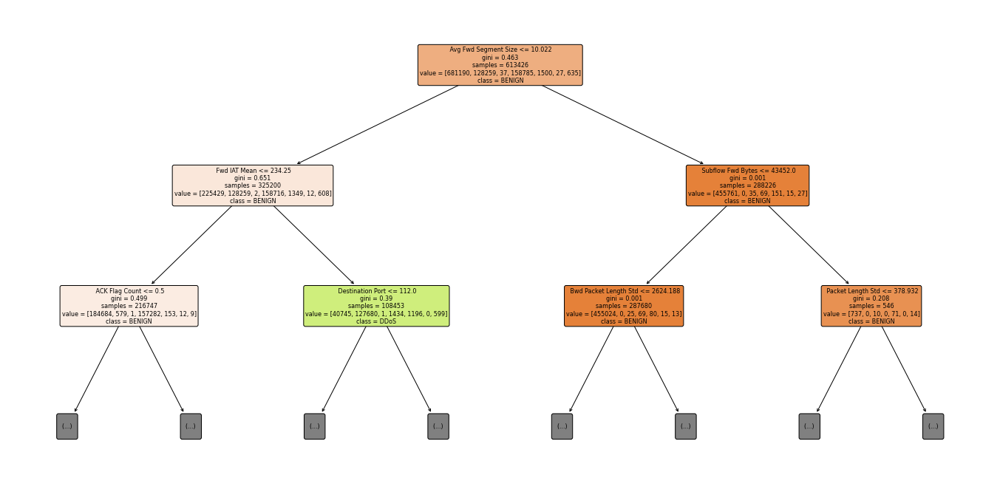

DecisionTreeClassifier(max_features='auto', random_state=1644972080)


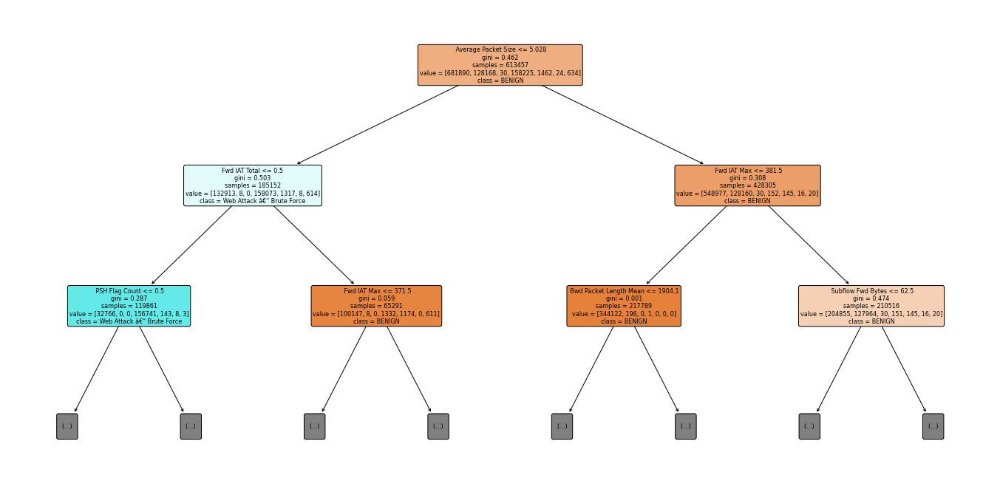

DecisionTreeClassifier(max_features='auto', random_state=467427621)


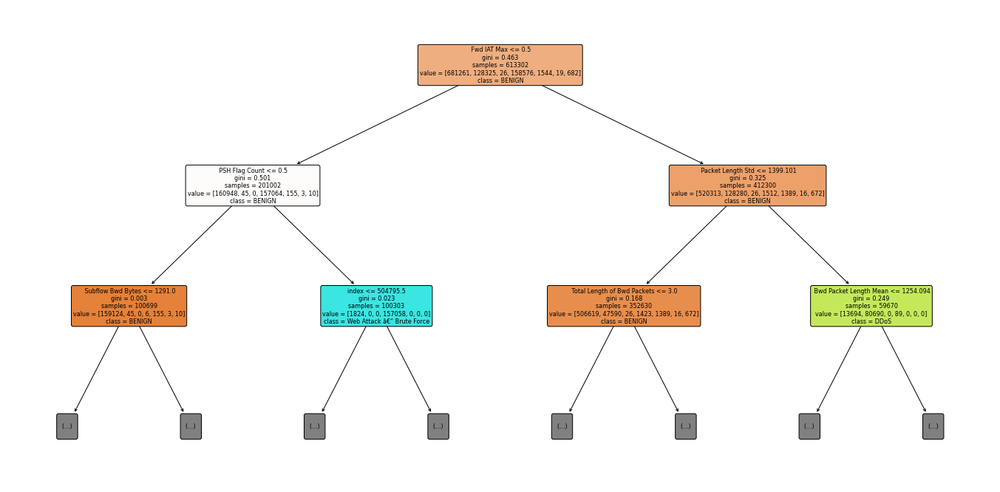

DecisionTreeClassifier(max_features='auto', random_state=418725936)


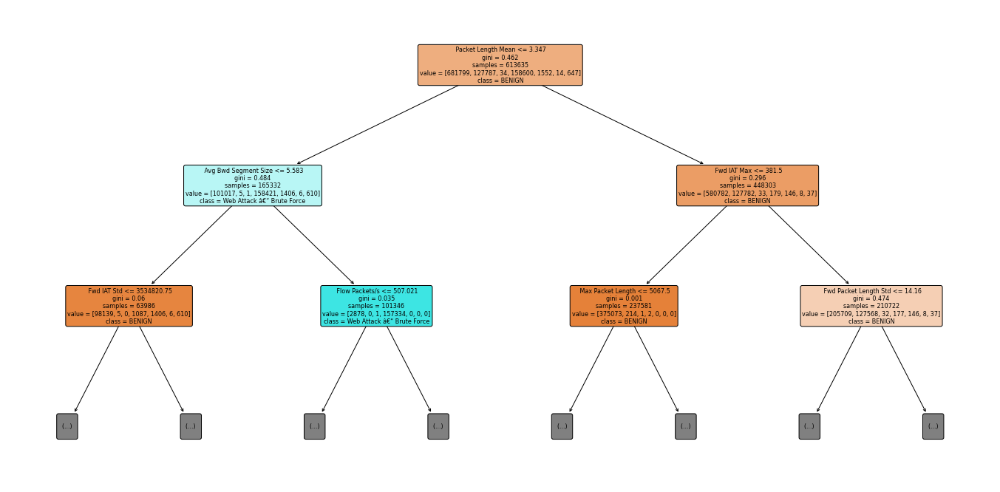

DecisionTreeClassifier(max_features='auto', random_state=1354224018)


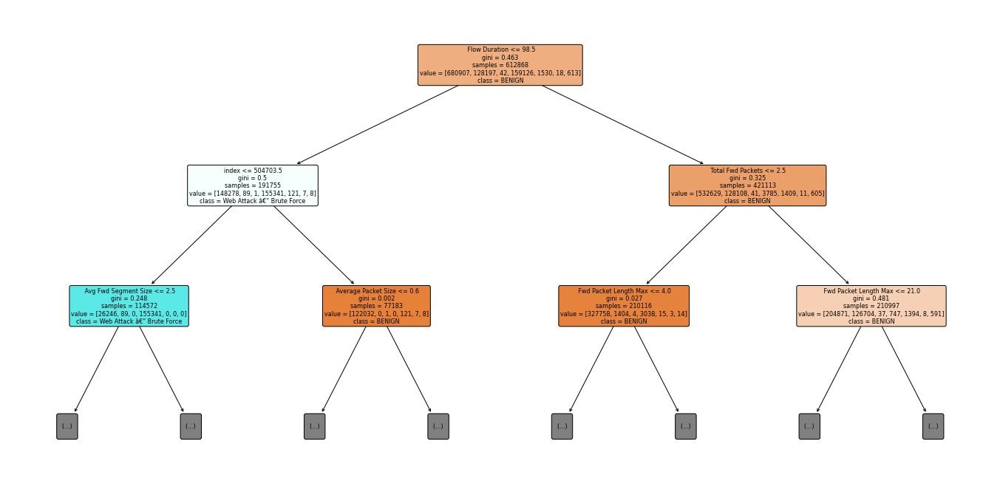

DecisionTreeClassifier(max_features='auto', random_state=407774531)


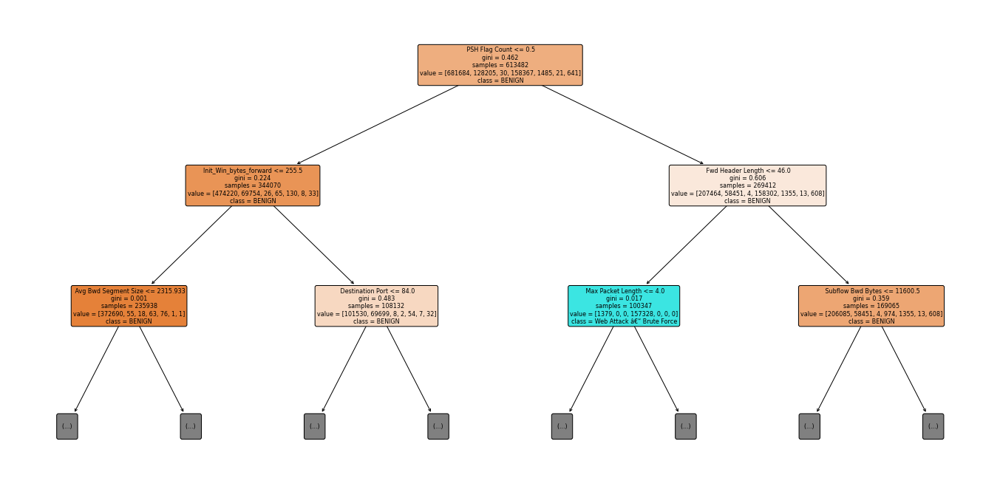

DecisionTreeClassifier(max_features='auto', random_state=1530740569)


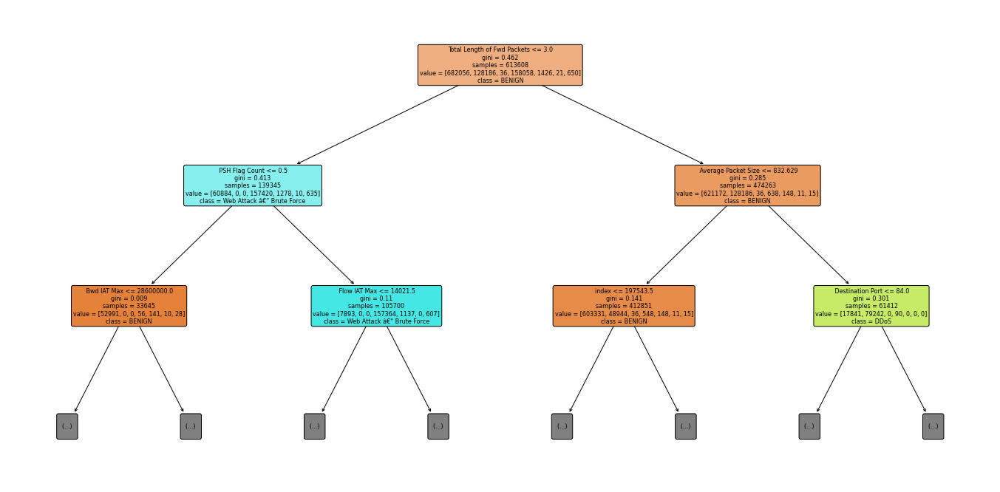

DecisionTreeClassifier(max_features='auto', random_state=905972730)


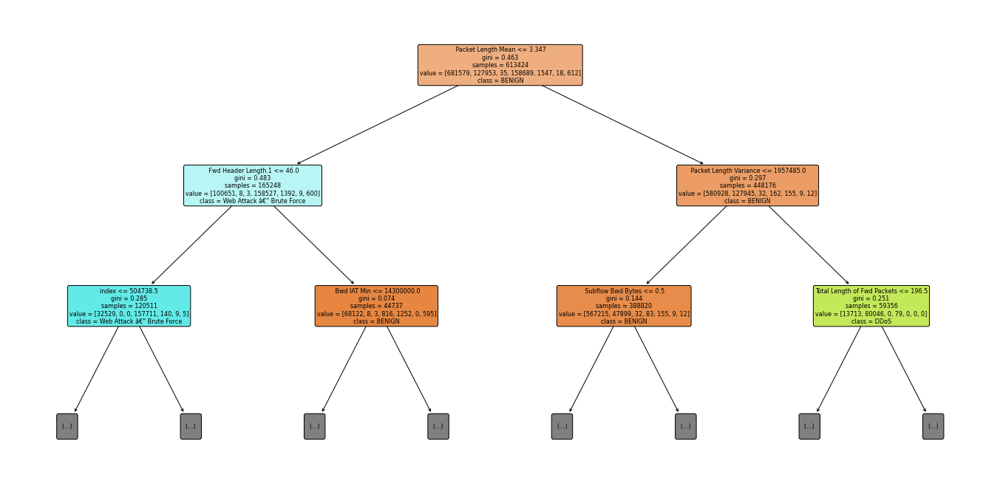

DecisionTreeClassifier(max_features='auto', random_state=1512071121)


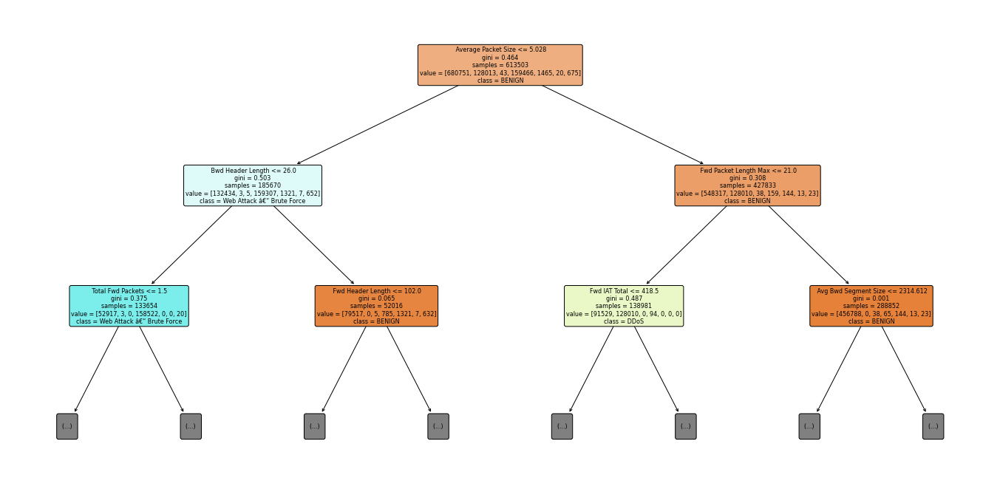

DecisionTreeClassifier(max_features='auto', random_state=1287128922)


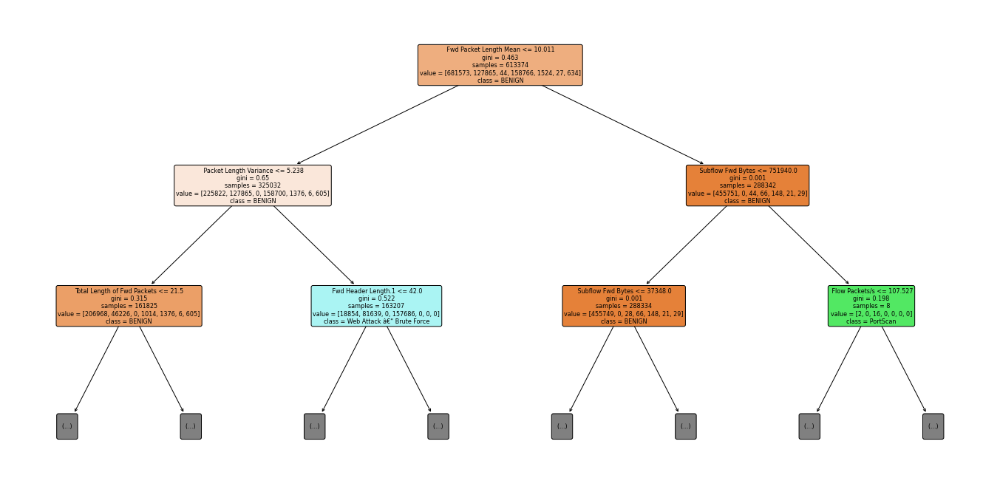

DecisionTreeClassifier(max_features='auto', random_state=868128497)


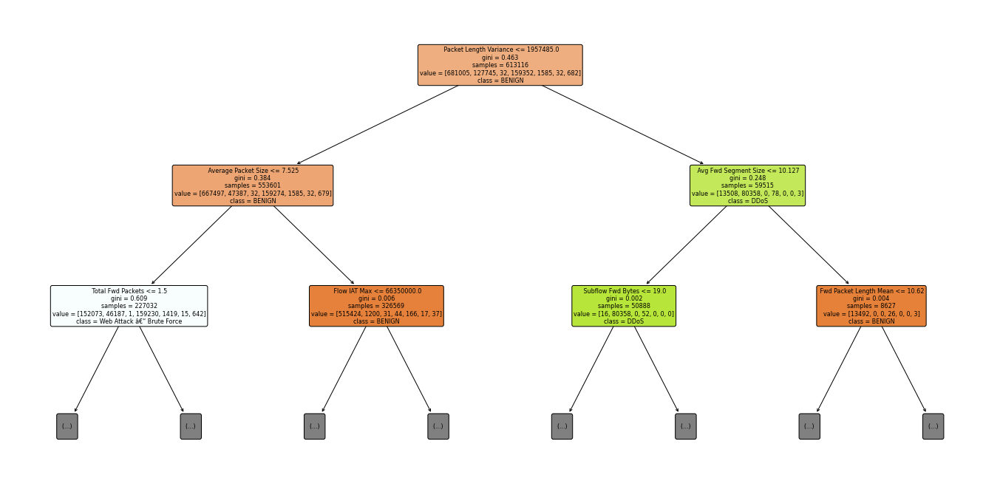

DecisionTreeClassifier(max_features='auto', random_state=1391449887)


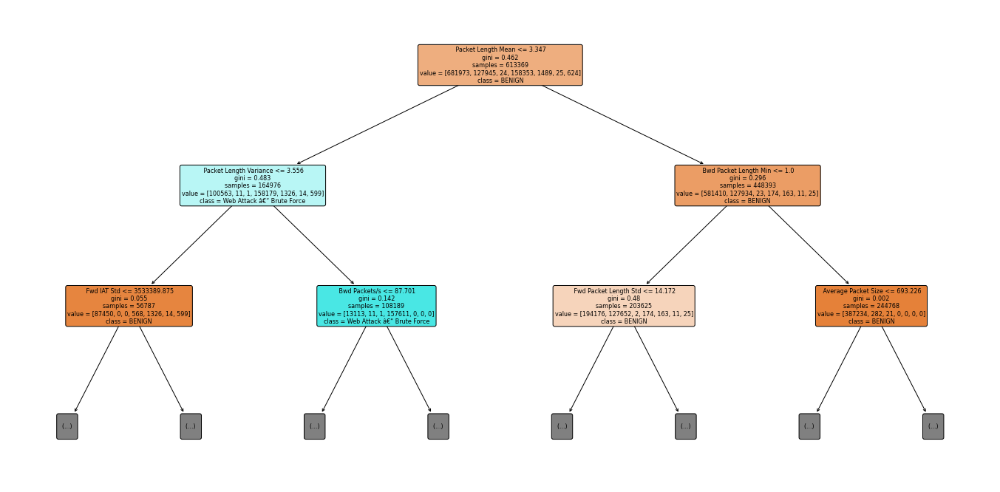

DecisionTreeClassifier(max_features='auto', random_state=1662949203)


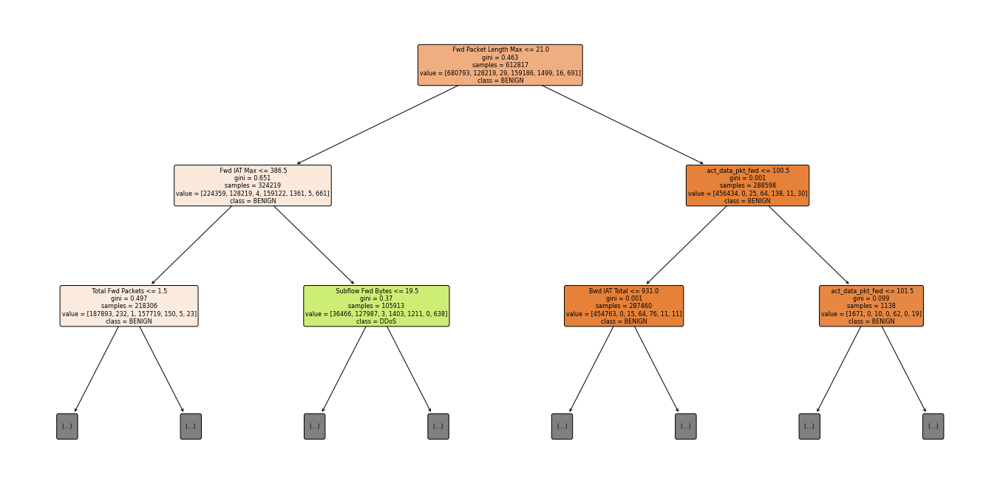

DecisionTreeClassifier(max_features='auto', random_state=463486236)


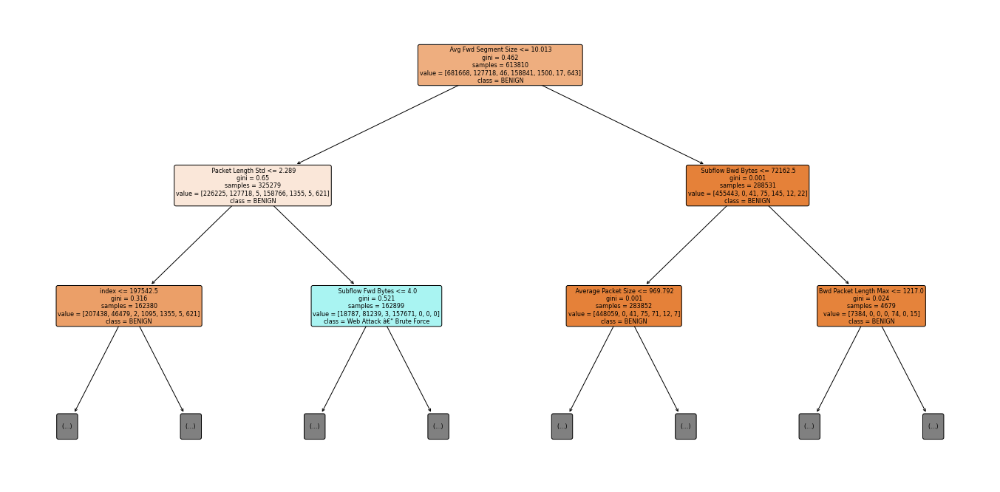

DecisionTreeClassifier(max_features='auto', random_state=1800574841)


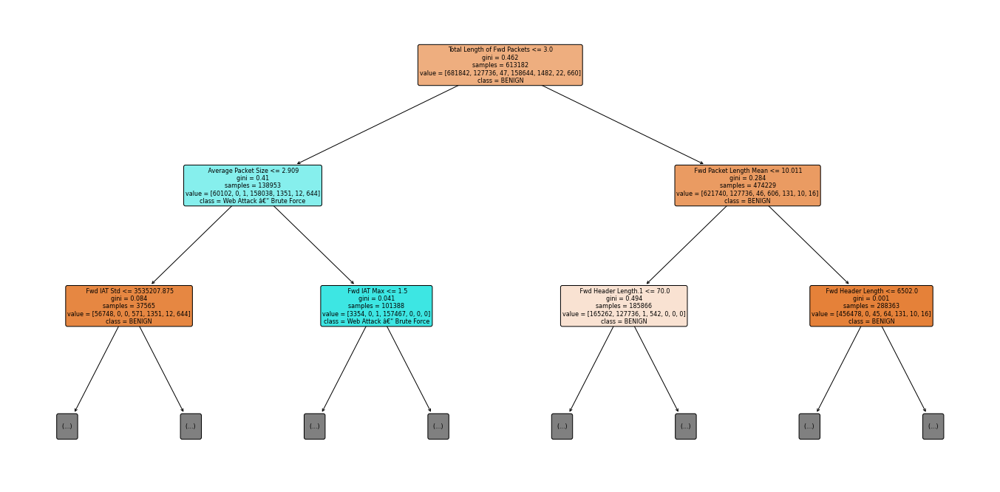

DecisionTreeClassifier(max_features='auto', random_state=2100937782)


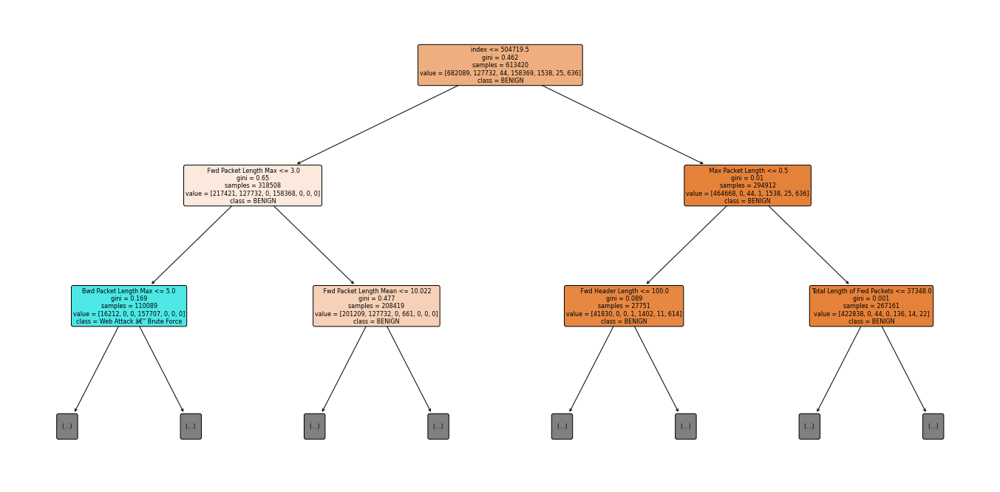

DecisionTreeClassifier(max_features='auto', random_state=1361322829)


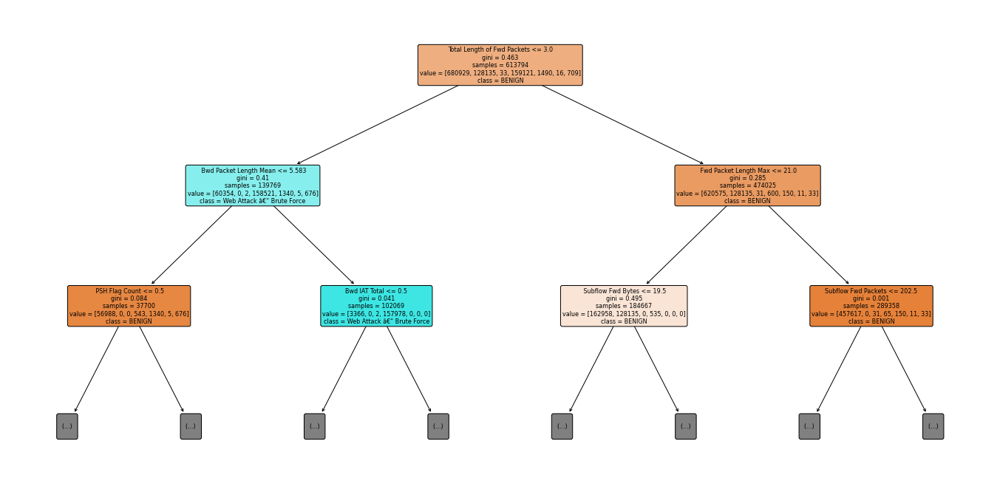

DecisionTreeClassifier(max_features='auto', random_state=2078940841)


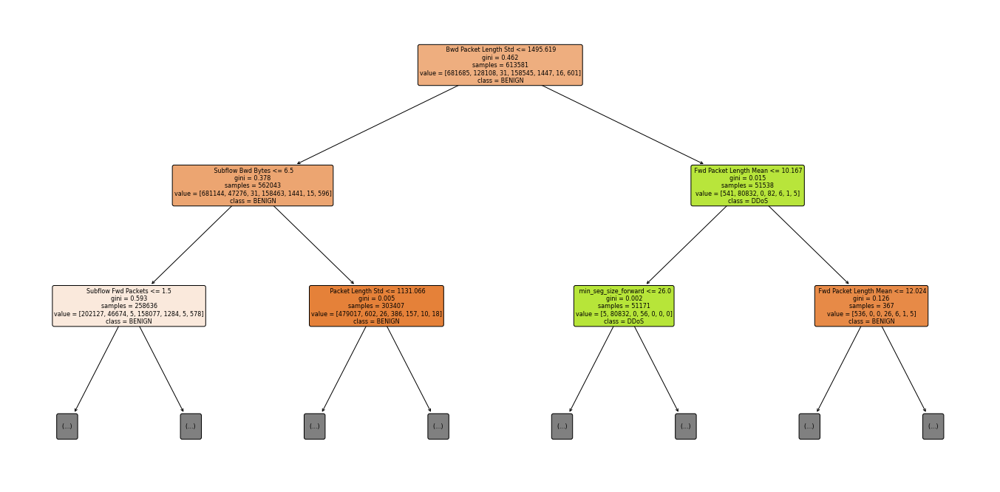

DecisionTreeClassifier(max_features='auto', random_state=483205072)


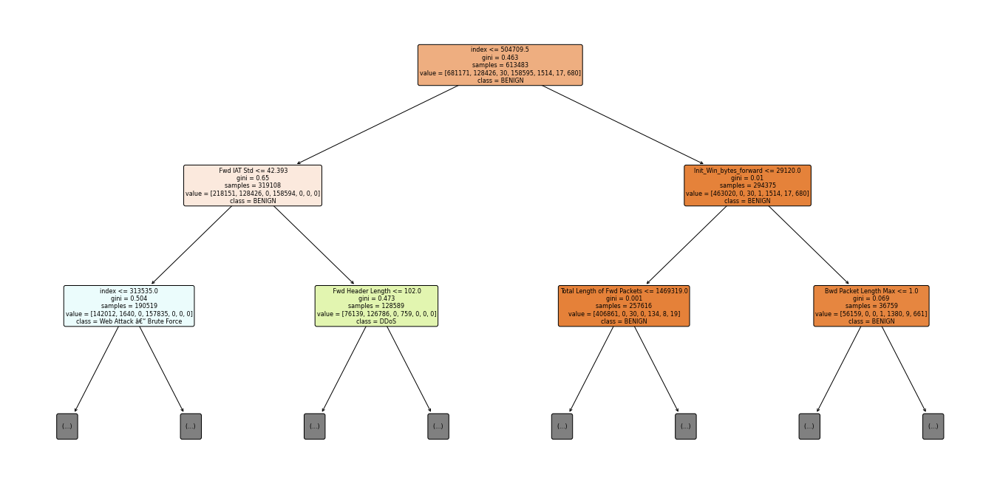

DecisionTreeClassifier(max_features='auto', random_state=997940128)


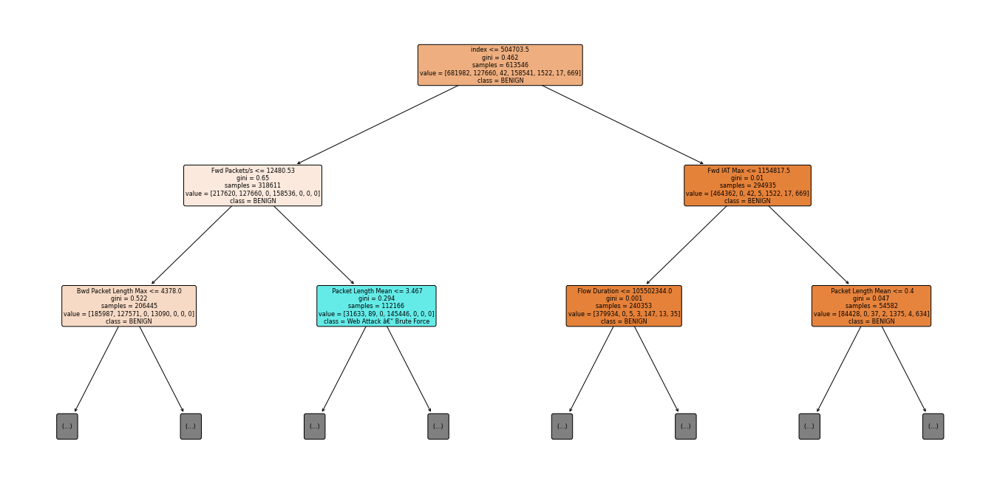

DecisionTreeClassifier(max_features='auto', random_state=1135054706)


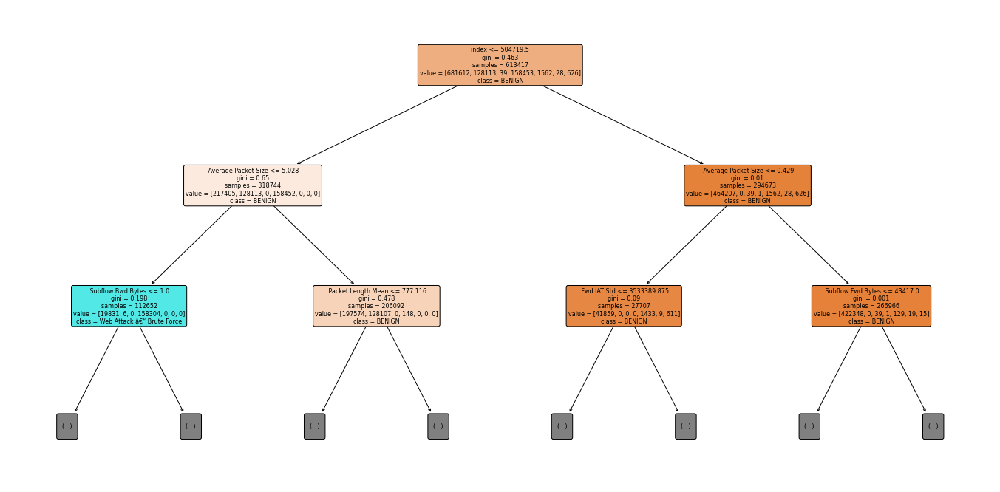

DecisionTreeClassifier(max_features='auto', random_state=910818852)


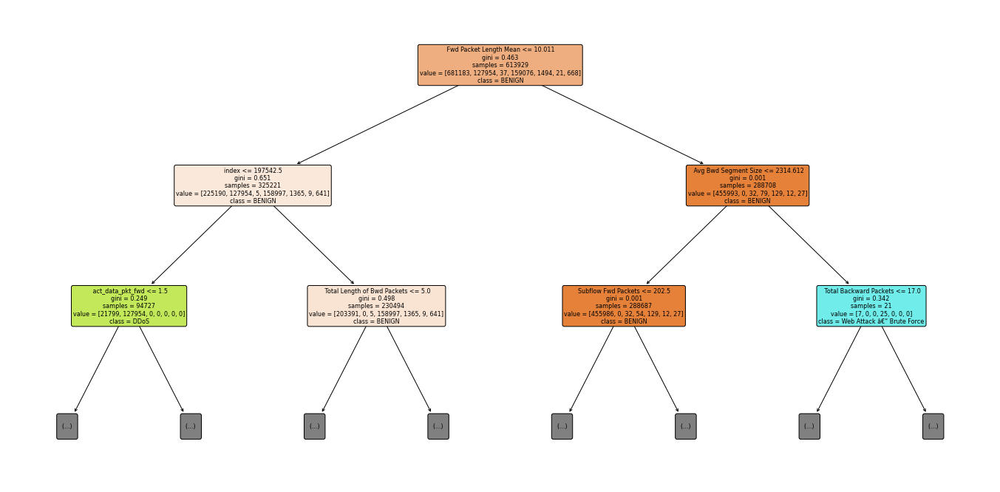

DecisionTreeClassifier(max_features='auto', random_state=1726286599)


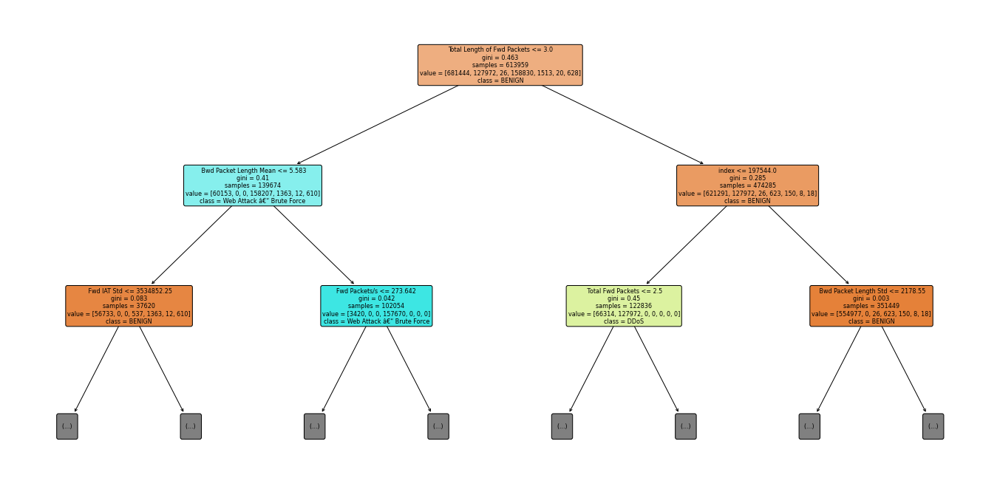

DecisionTreeClassifier(max_features='auto', random_state=1145397126)


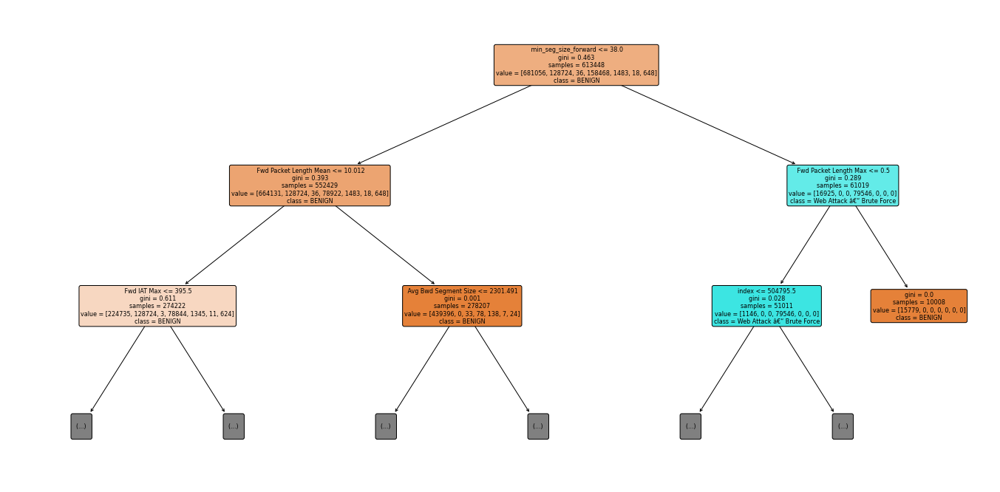

DecisionTreeClassifier(max_features='auto', random_state=123551938)


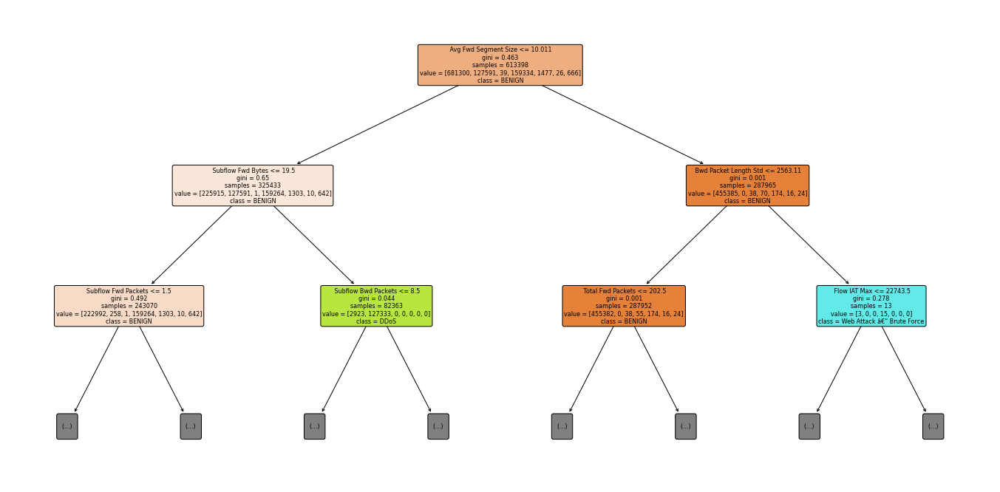

DecisionTreeClassifier(max_features='auto', random_state=909595963)


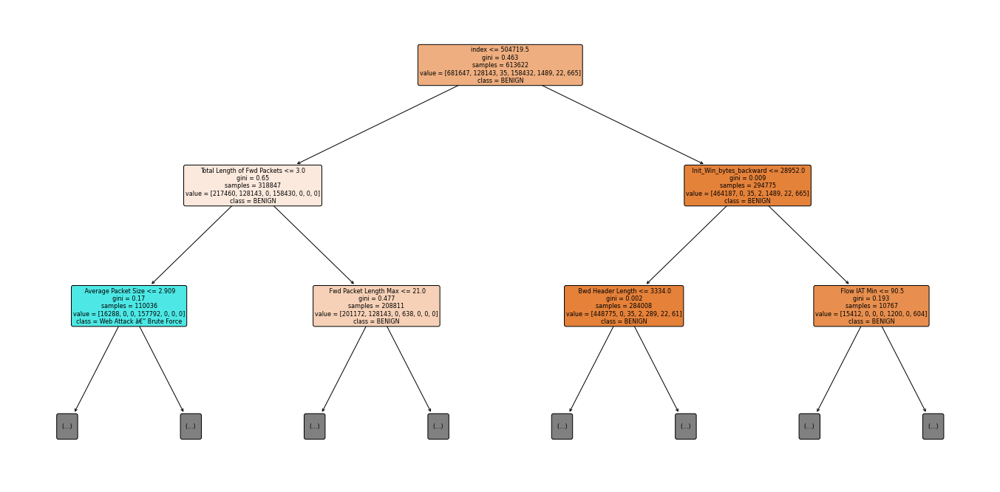

DecisionTreeClassifier(max_features='auto', random_state=560112981)


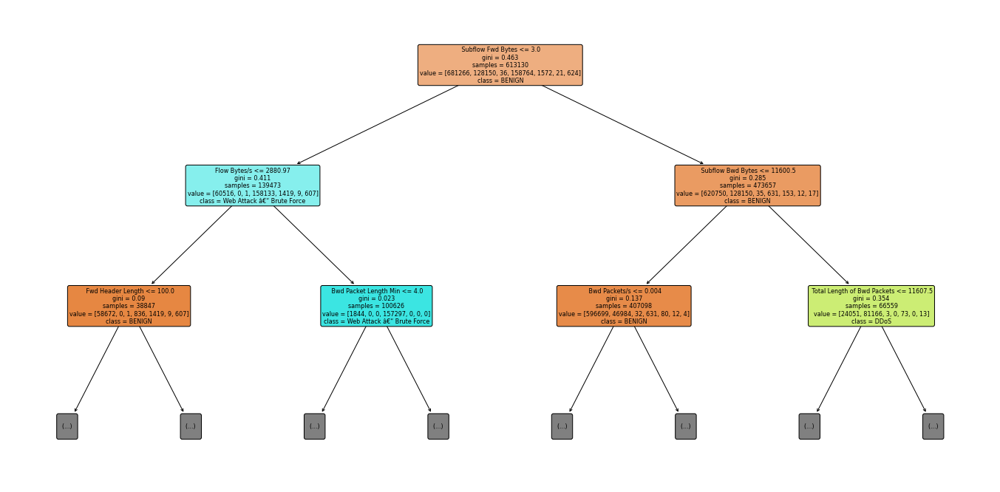

DecisionTreeClassifier(max_features='auto', random_state=99535032)


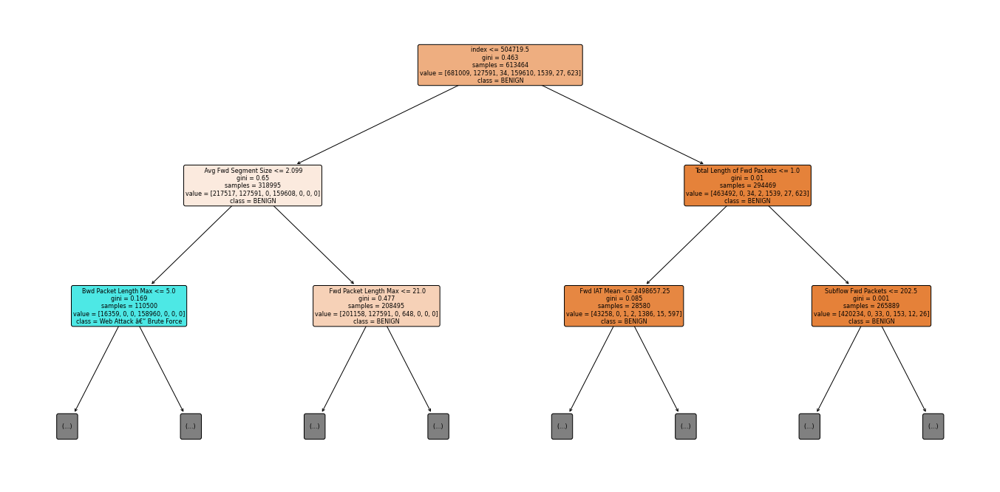

DecisionTreeClassifier(max_features='auto', random_state=1753063897)


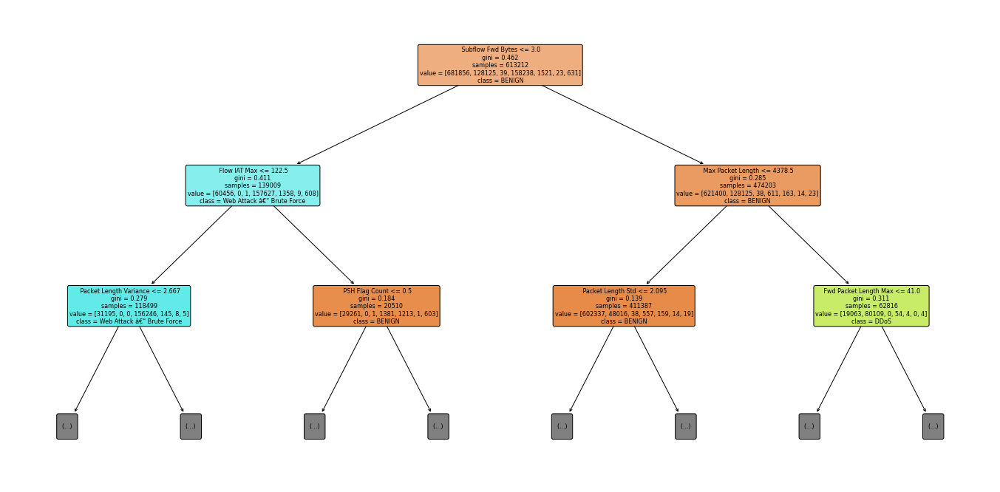

DecisionTreeClassifier(max_features='auto', random_state=1692802982)


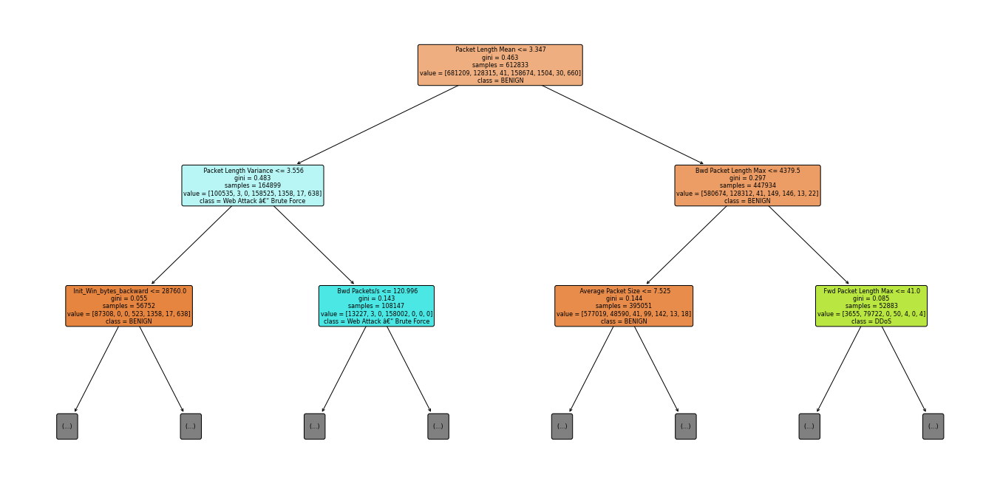

DecisionTreeClassifier(max_features='auto', random_state=722577702)


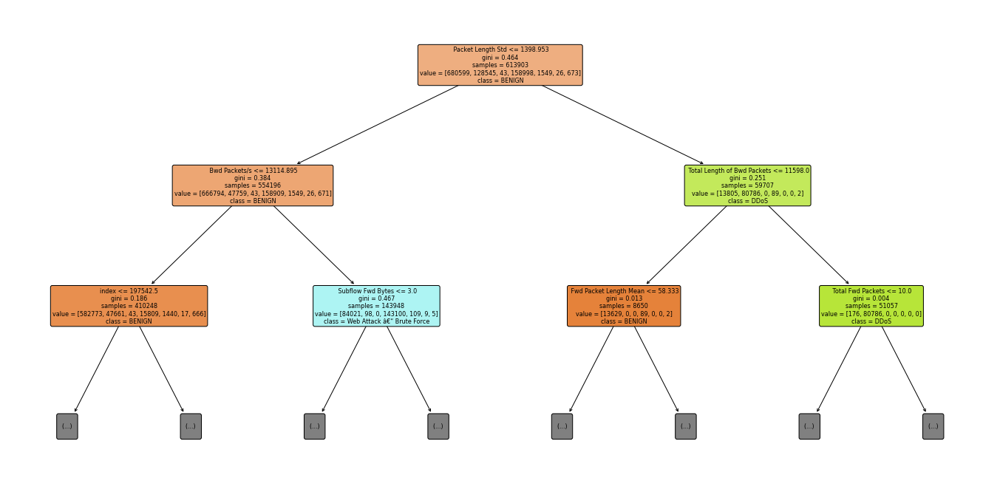

DecisionTreeClassifier(max_features='auto', random_state=2128505995)


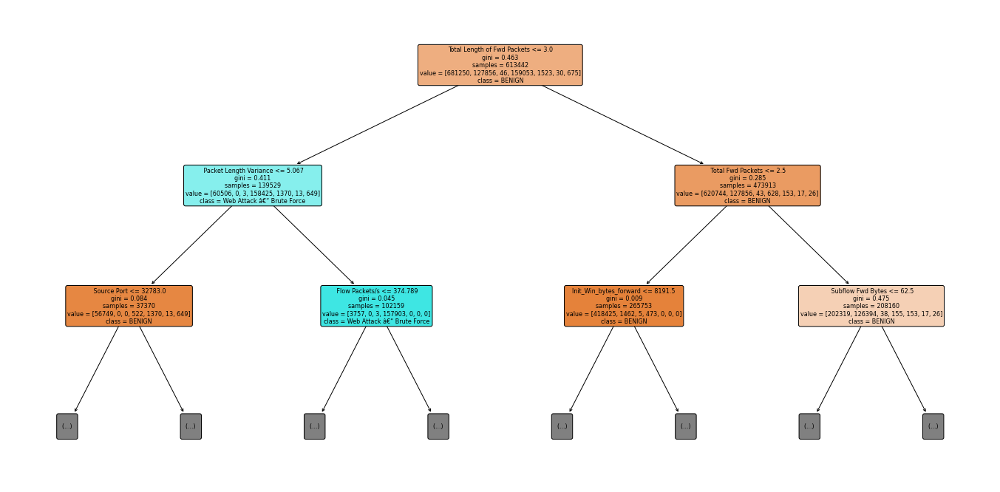

DecisionTreeClassifier(max_features='auto', random_state=1264630099)


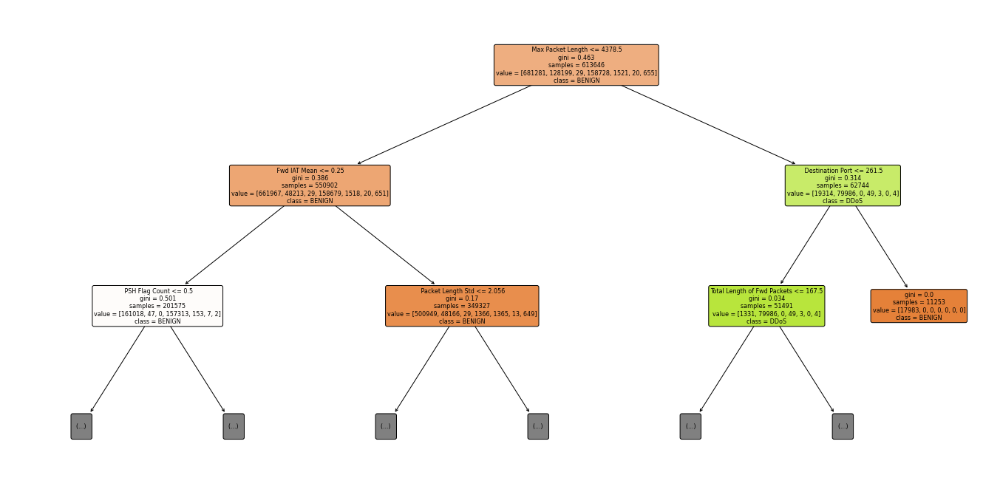

DecisionTreeClassifier(max_features='auto', random_state=1810235148)


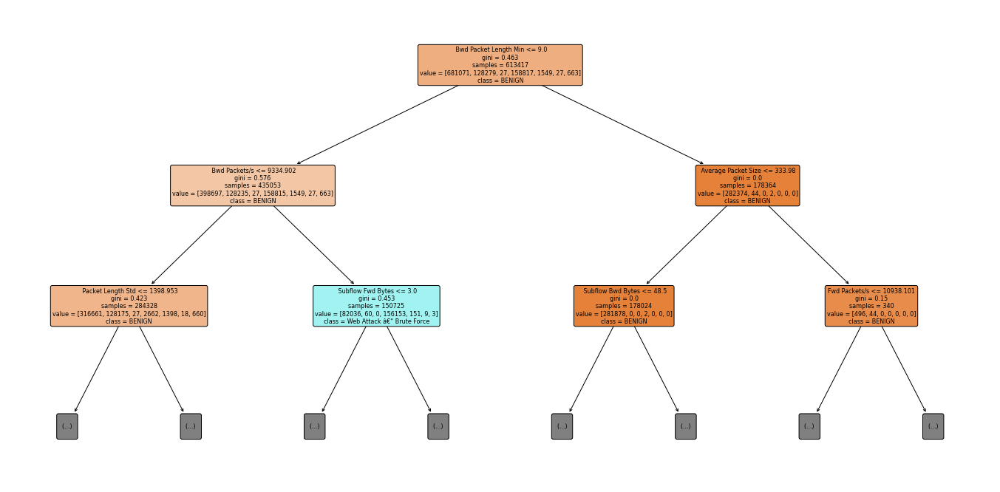

DecisionTreeClassifier(max_features='auto', random_state=1214478273)


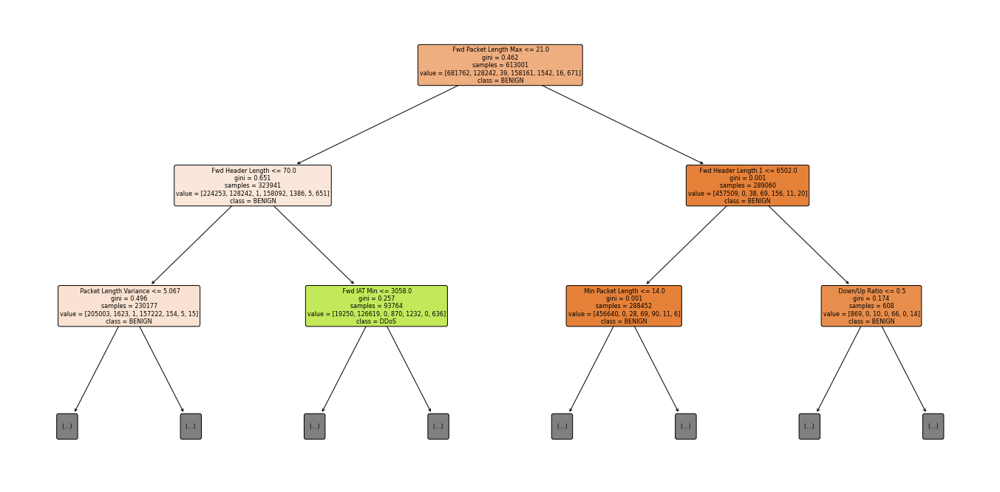

DecisionTreeClassifier(max_features='auto', random_state=1082600756)


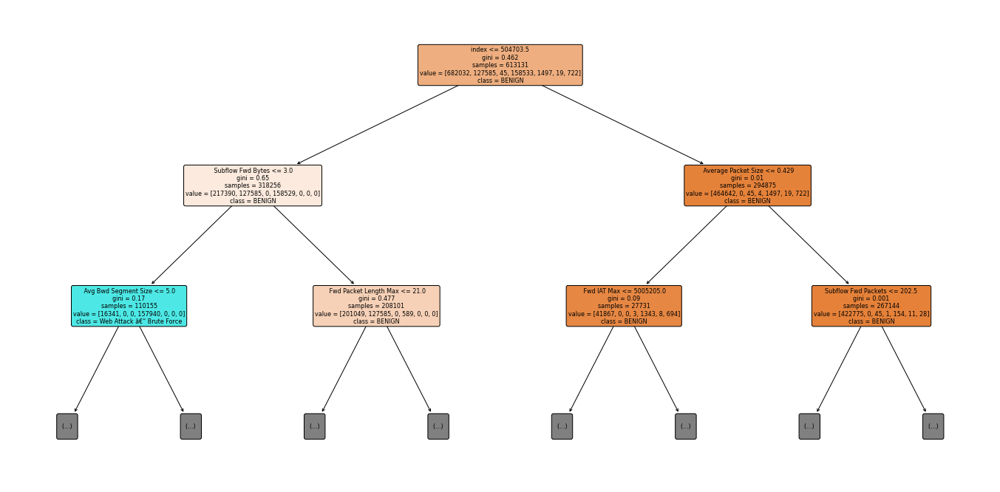

DecisionTreeClassifier(max_features='auto', random_state=837837978)


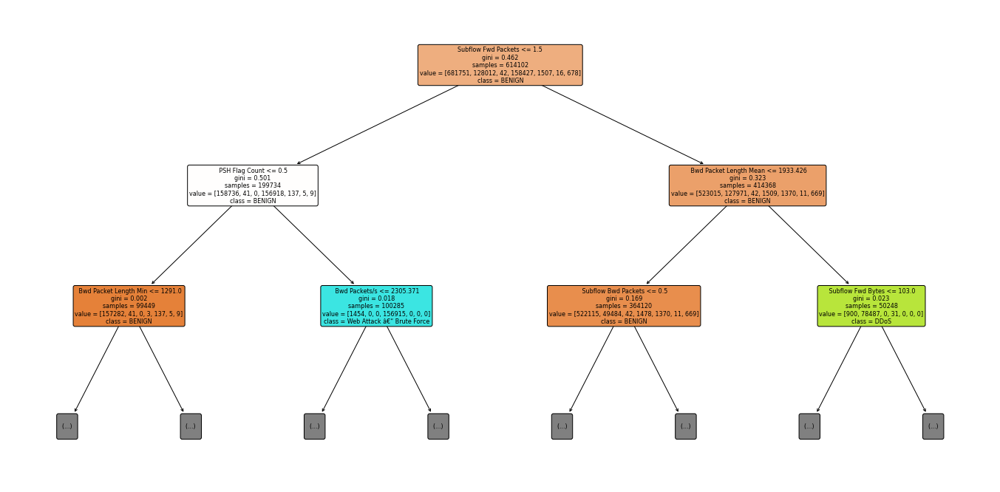

DecisionTreeClassifier(max_features='auto', random_state=708134881)


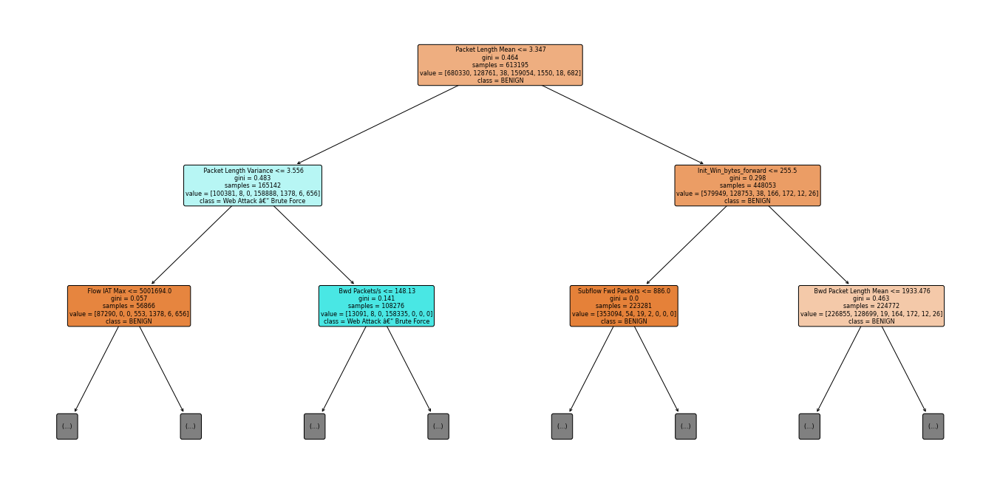

DecisionTreeClassifier(max_features='auto', random_state=1241223286)


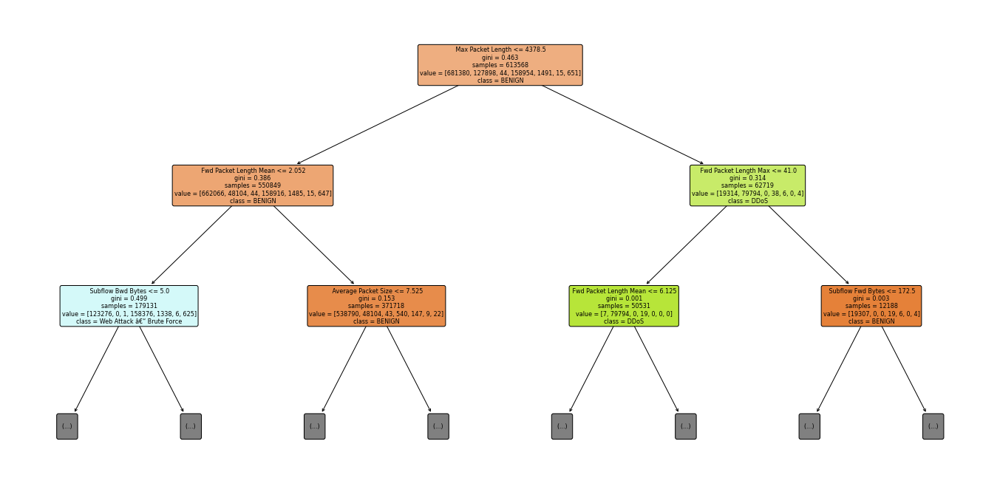

DecisionTreeClassifier(max_features='auto', random_state=1044679319)


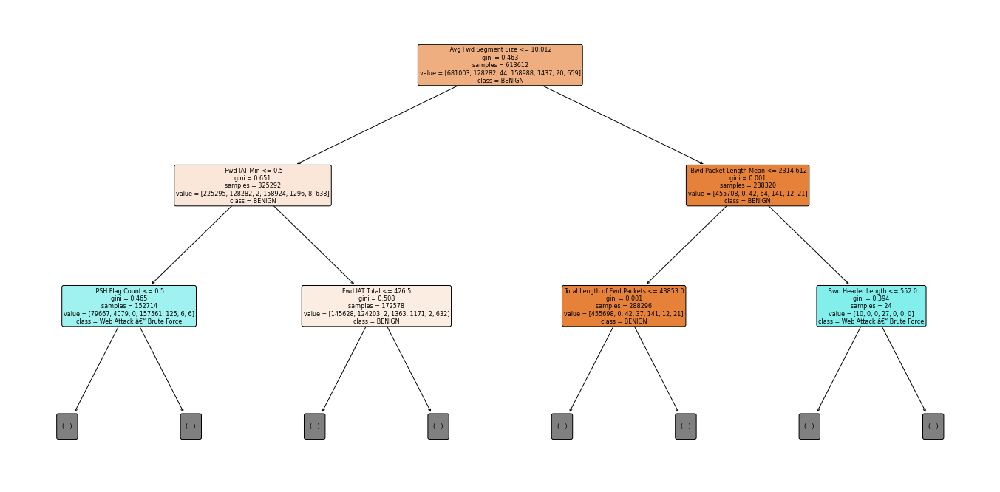

DecisionTreeClassifier(max_features='auto', random_state=766701577)


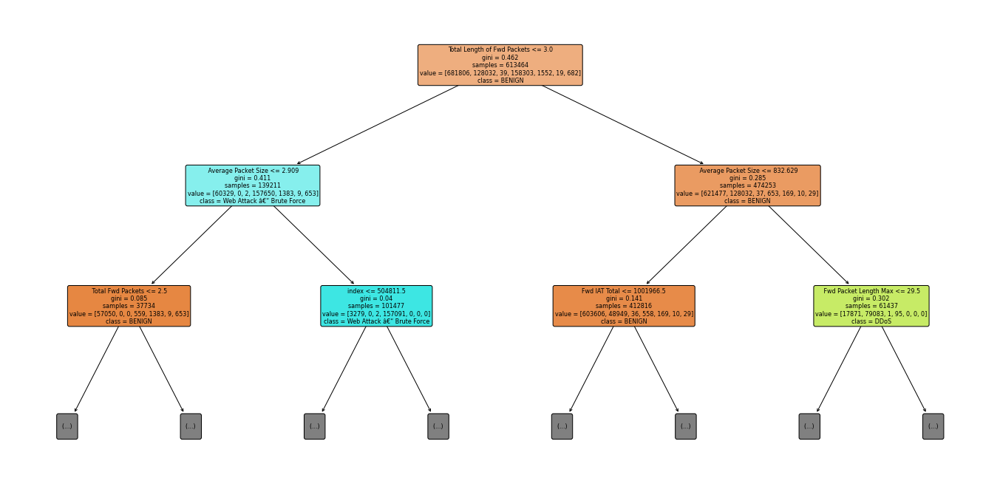

DecisionTreeClassifier(max_features='auto', random_state=906737861)


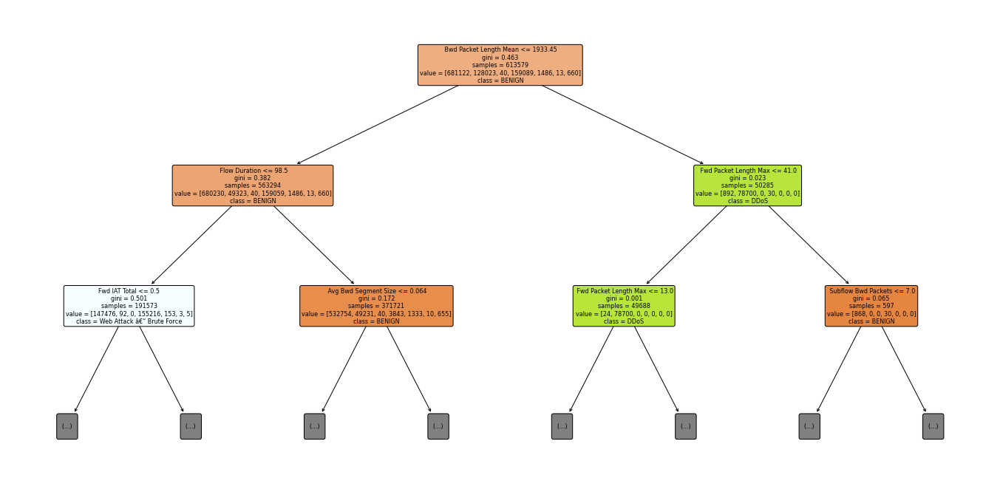

DecisionTreeClassifier(max_features='auto', random_state=148979515)


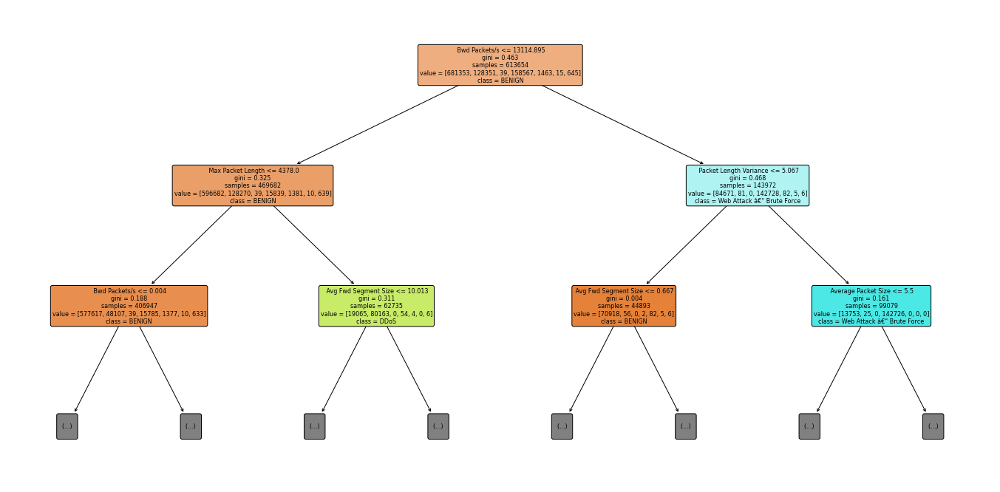

DecisionTreeClassifier(max_features='auto', random_state=493718103)


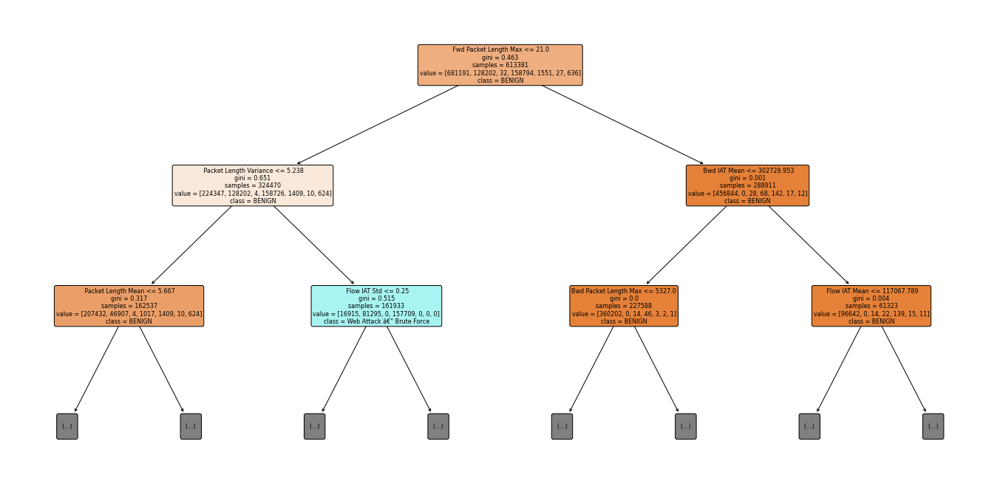

DecisionTreeClassifier(max_features='auto', random_state=1207155496)


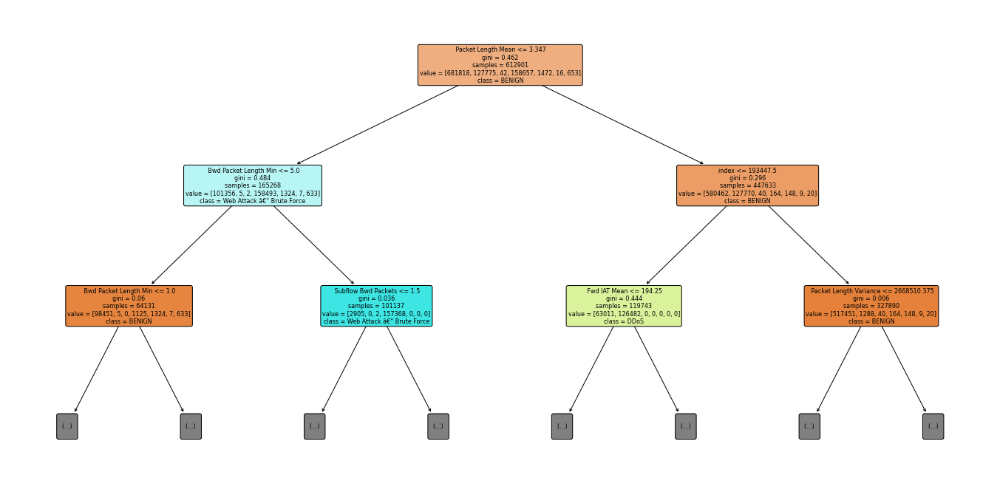

DecisionTreeClassifier(max_features='auto', random_state=58447057)


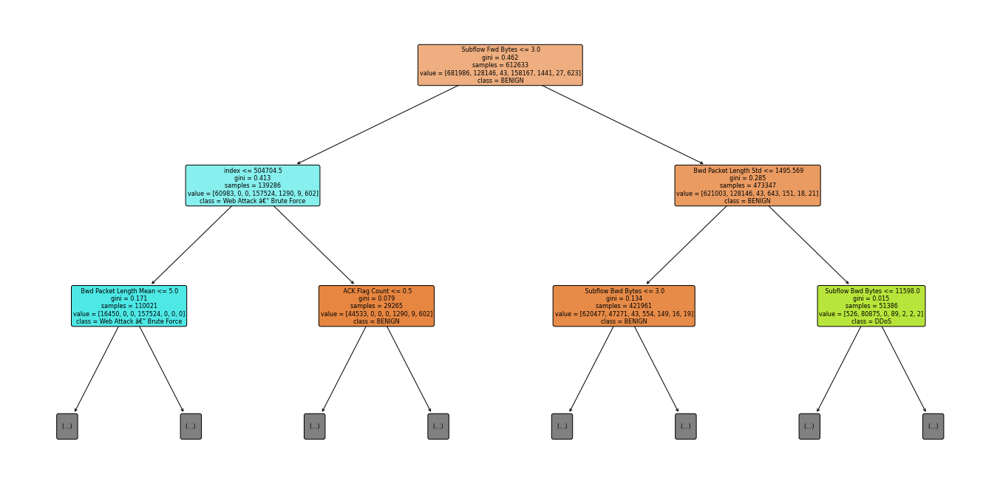

DecisionTreeClassifier(max_features='auto', random_state=1336769957)


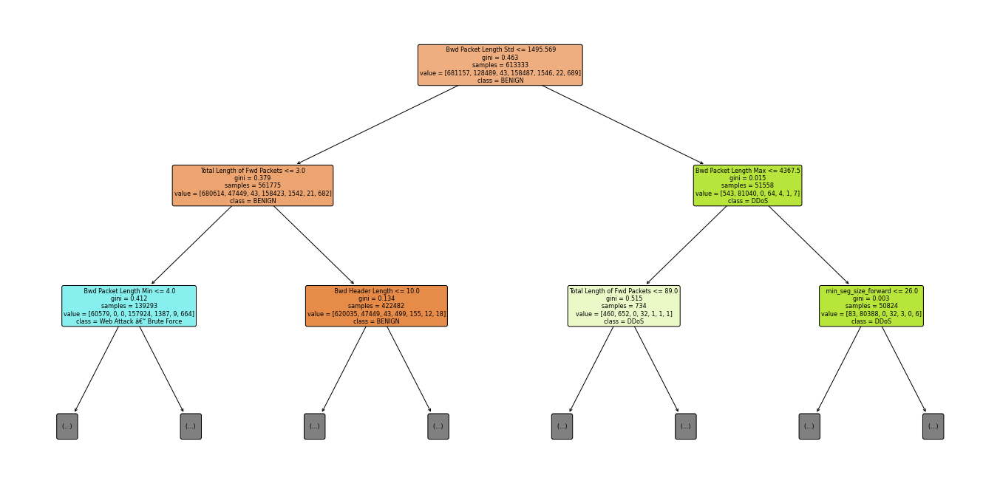

DecisionTreeClassifier(max_features='auto', random_state=310751933)


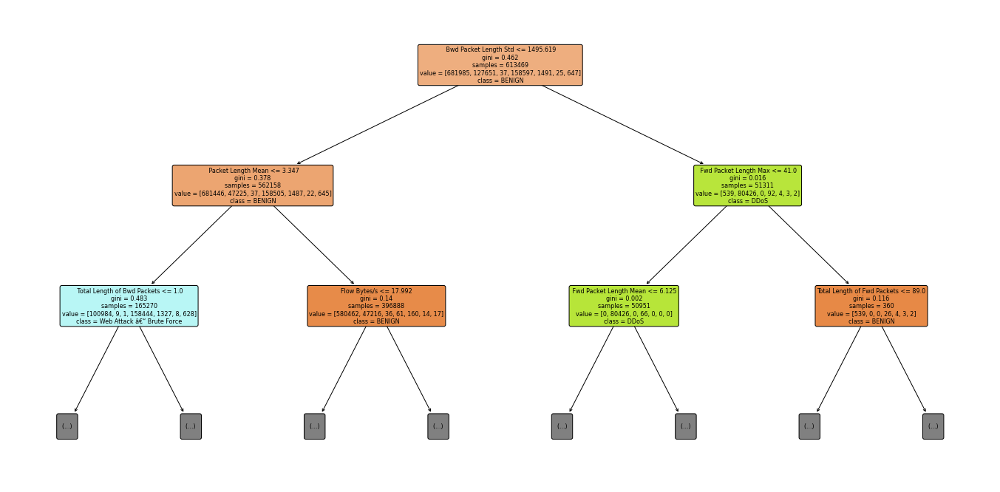

DecisionTreeClassifier(max_features='auto', random_state=561695237)


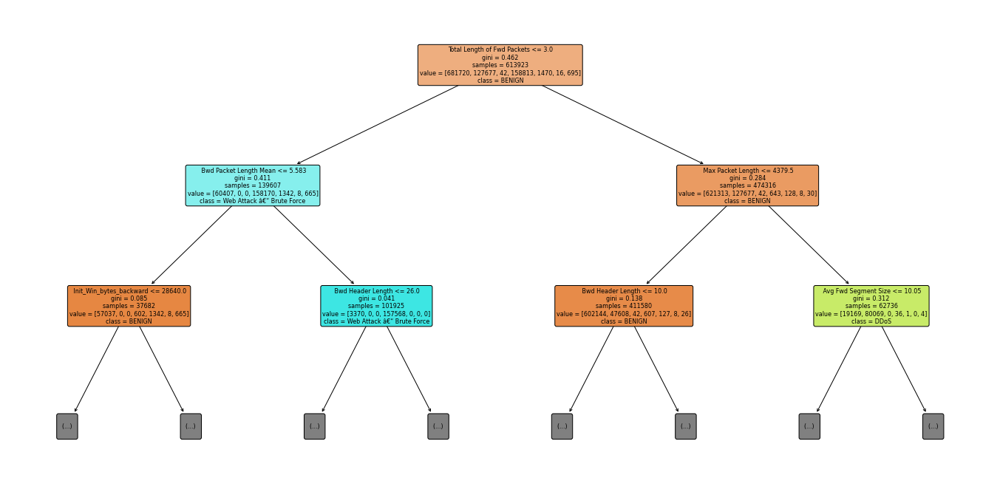

DecisionTreeClassifier(max_features='auto', random_state=900451857)


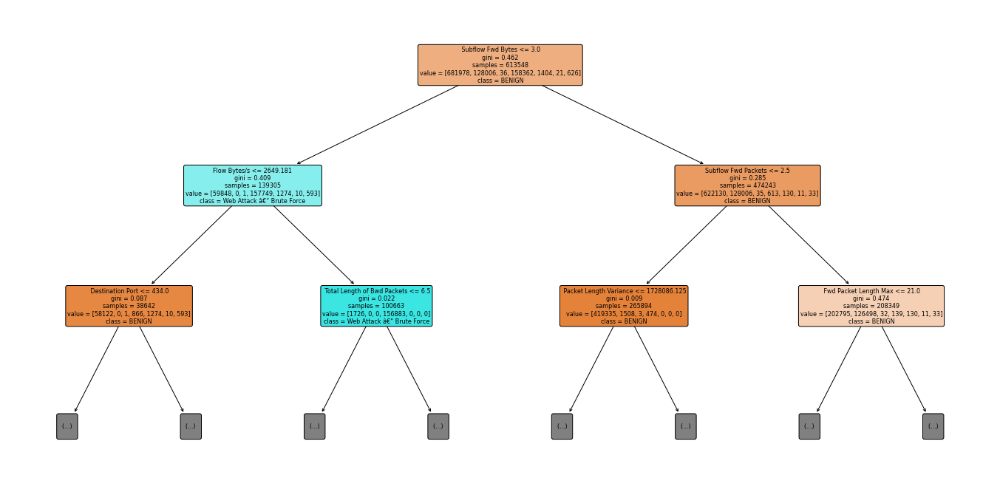

DecisionTreeClassifier(max_features='auto', random_state=950708468)


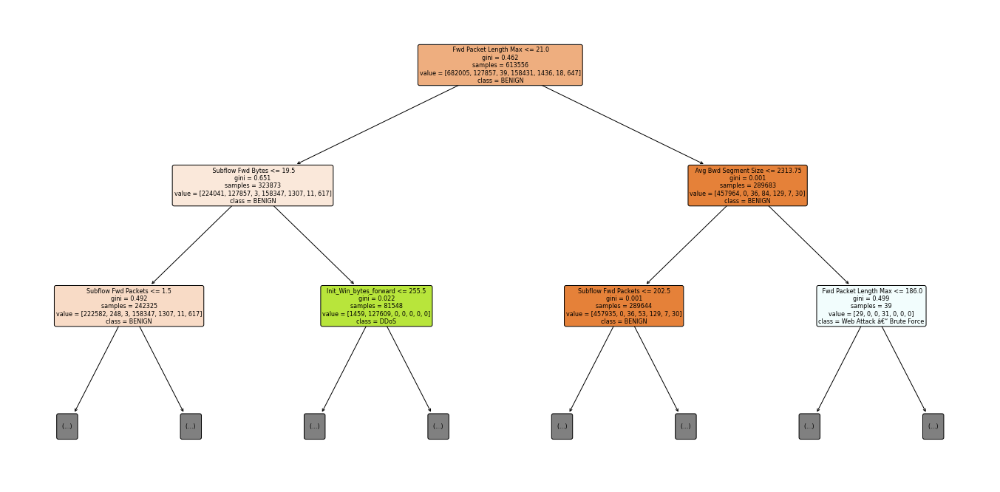

DecisionTreeClassifier(max_features='auto', random_state=332588660)


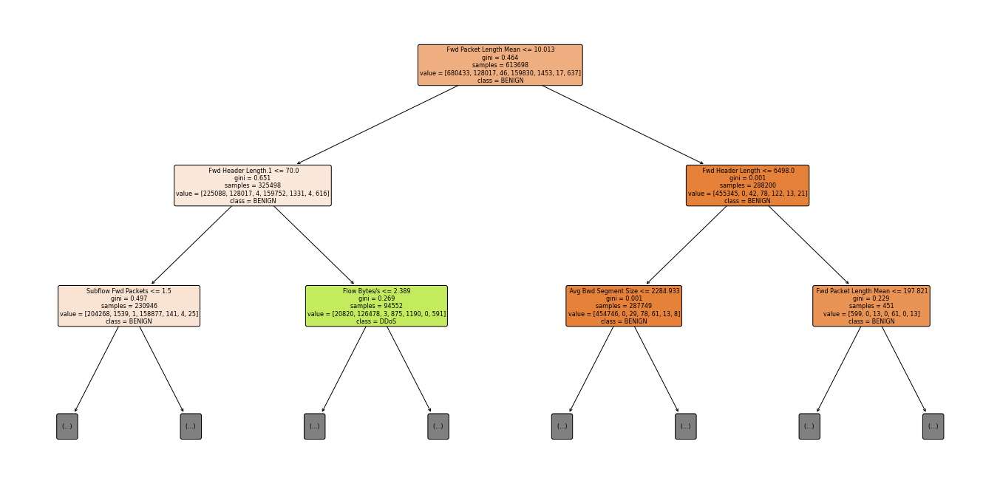

DecisionTreeClassifier(max_features='auto', random_state=1301923220)


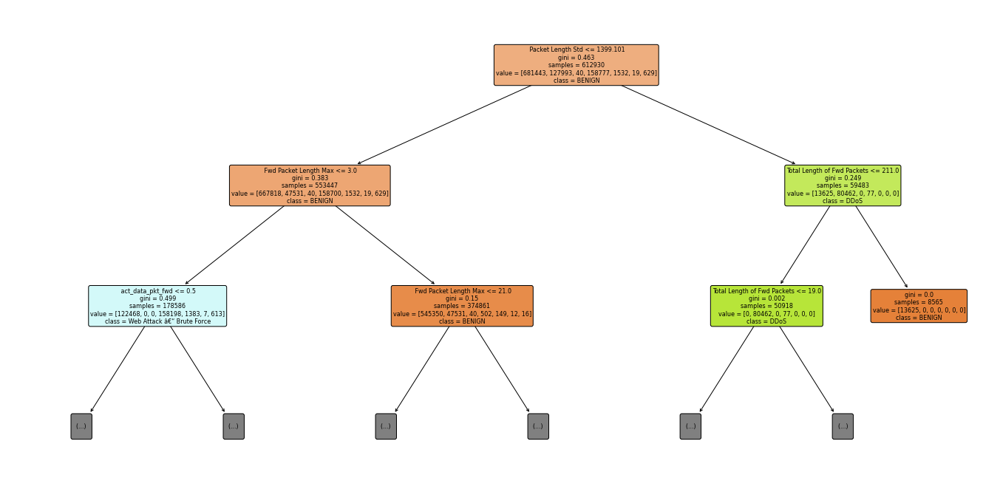

DecisionTreeClassifier(max_features='auto', random_state=1872355539)


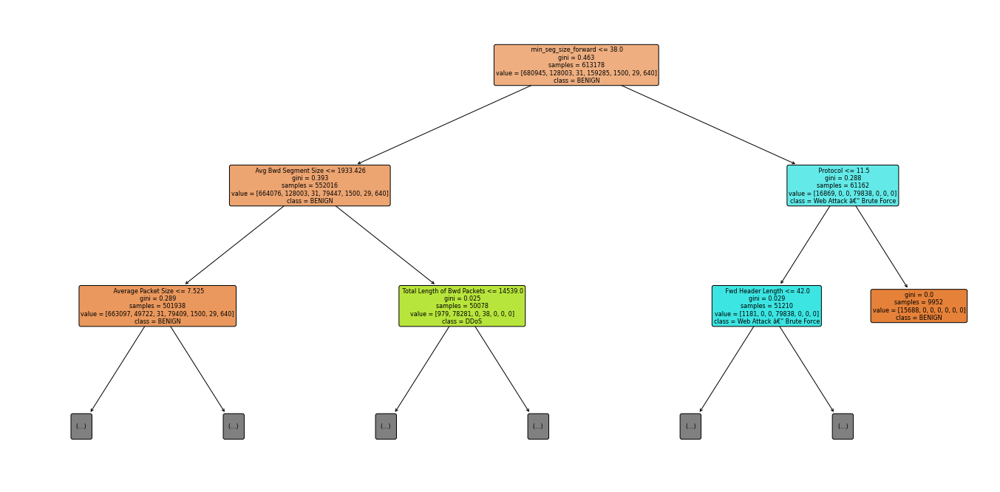

DecisionTreeClassifier(max_features='auto', random_state=1145715170)


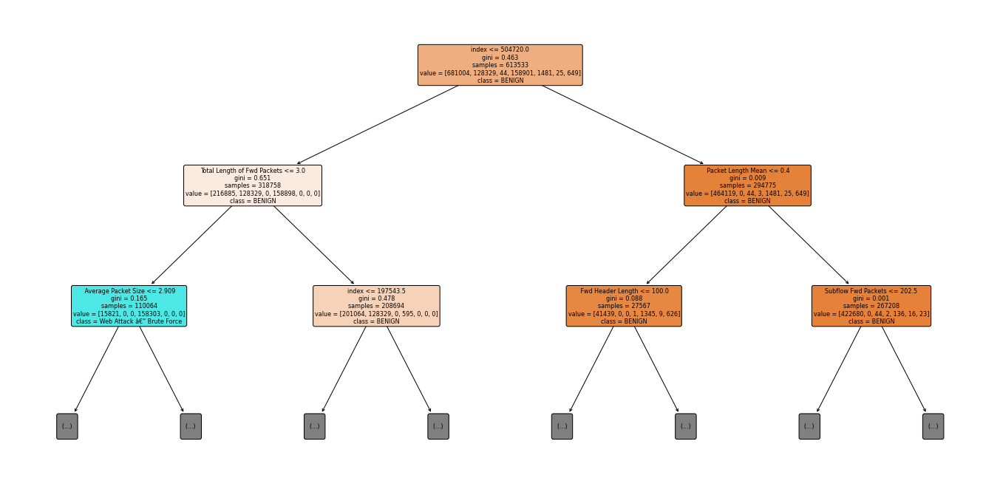

DecisionTreeClassifier(max_features='auto', random_state=455346409)


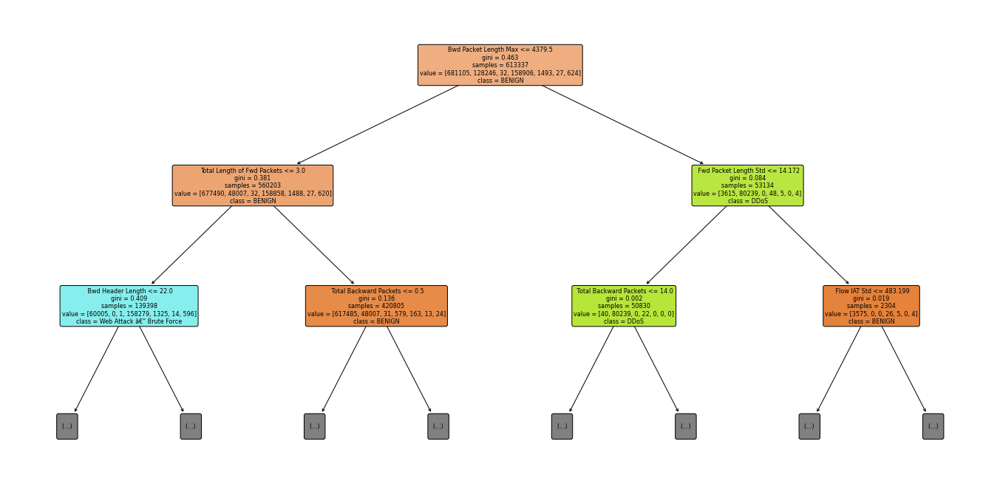

DecisionTreeClassifier(max_features='auto', random_state=23931675)


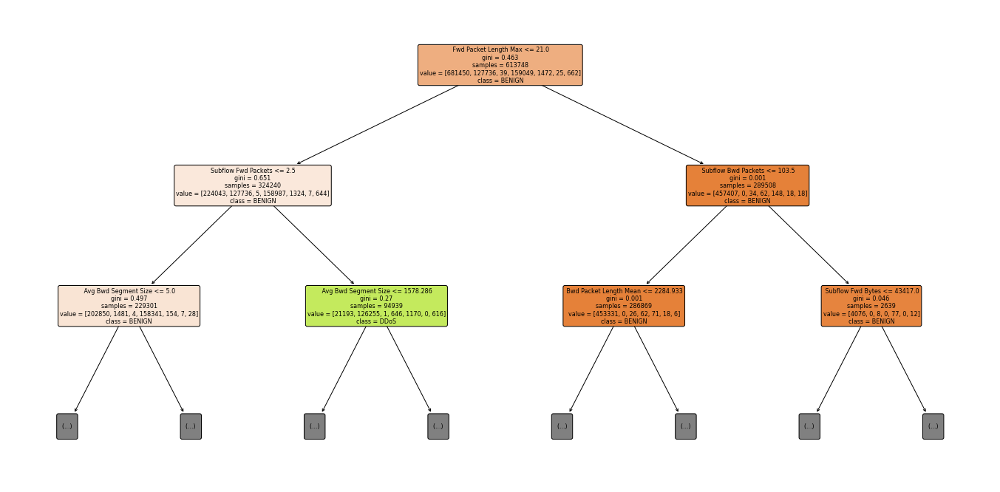

DecisionTreeClassifier(max_features='auto', random_state=147995081)


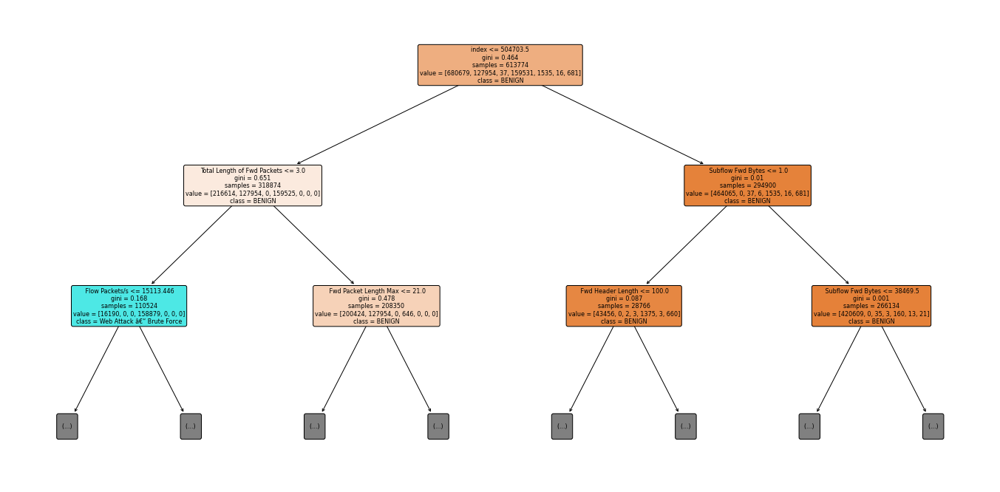

DecisionTreeClassifier(max_features='auto', random_state=2057218137)


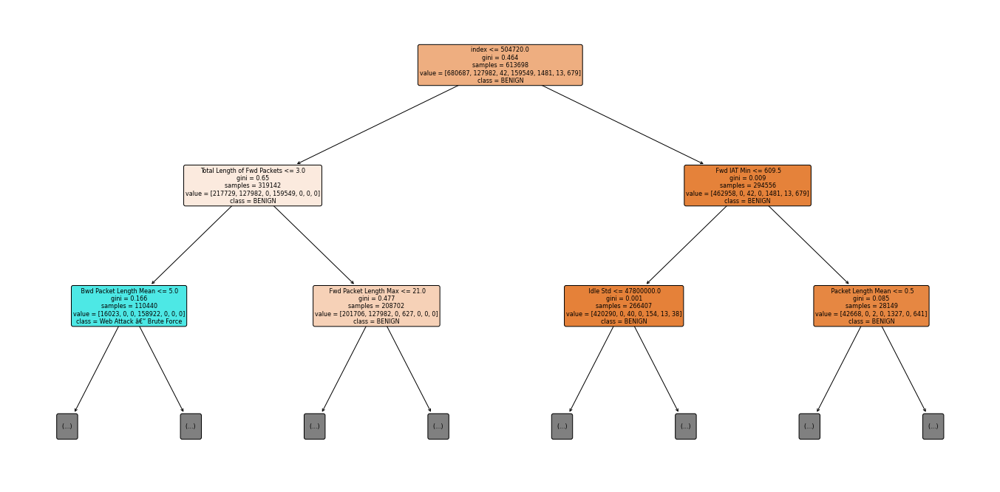

DecisionTreeClassifier(max_features='auto', random_state=1480448547)


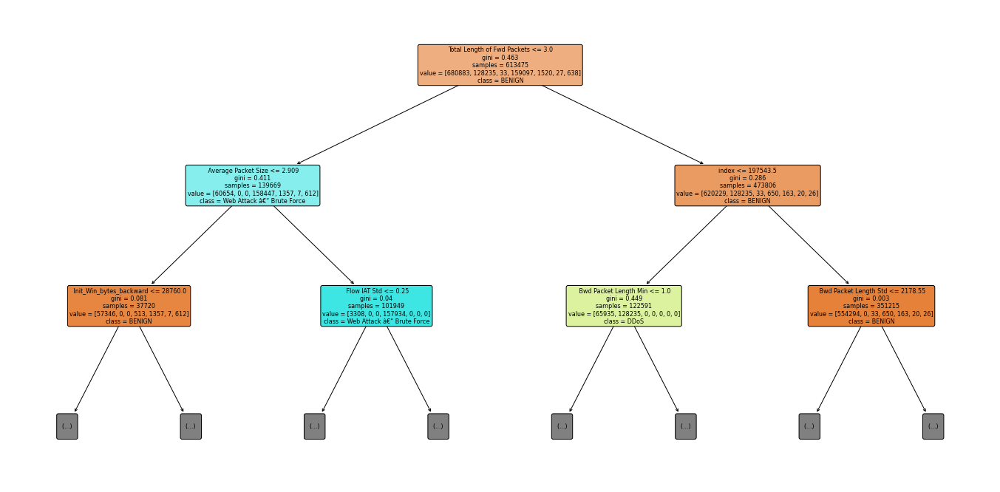

DecisionTreeClassifier(max_features='auto', random_state=1272028841)


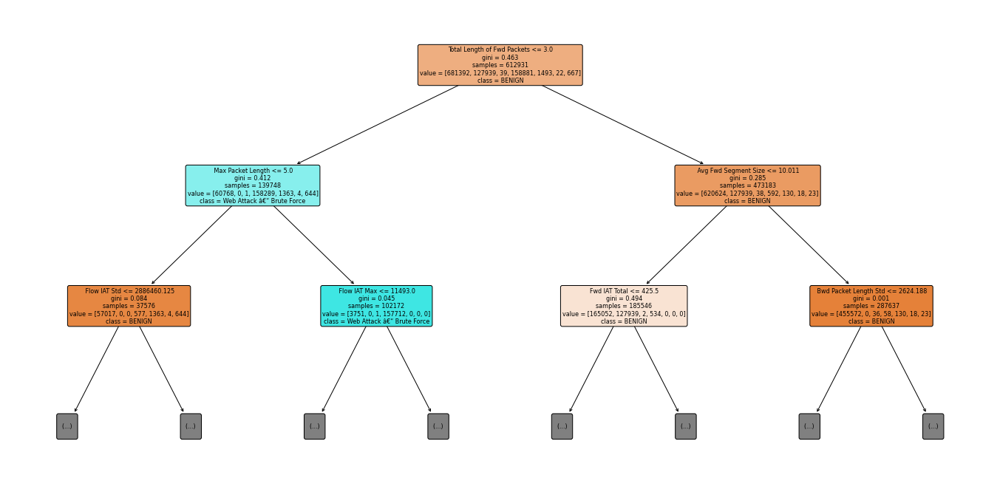

DecisionTreeClassifier(max_features='auto', random_state=446976440)


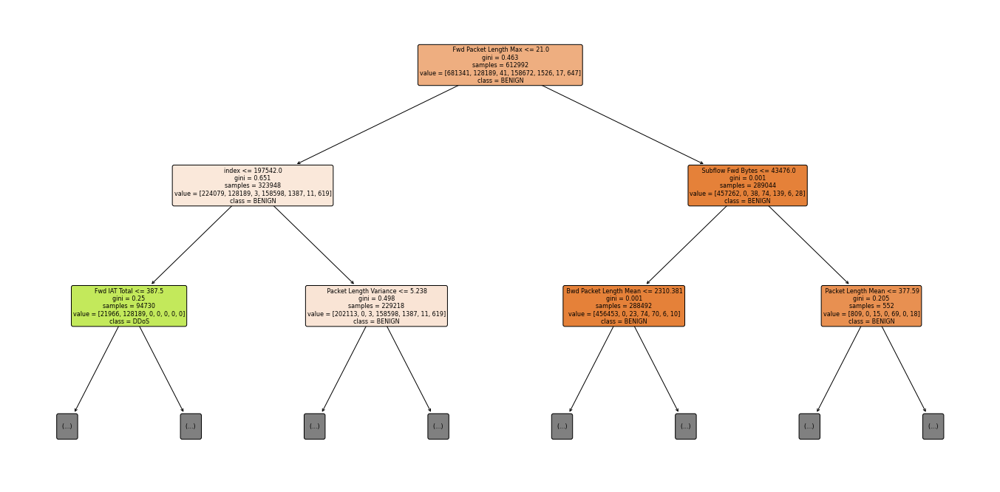

DecisionTreeClassifier(max_features='auto', random_state=80191742)


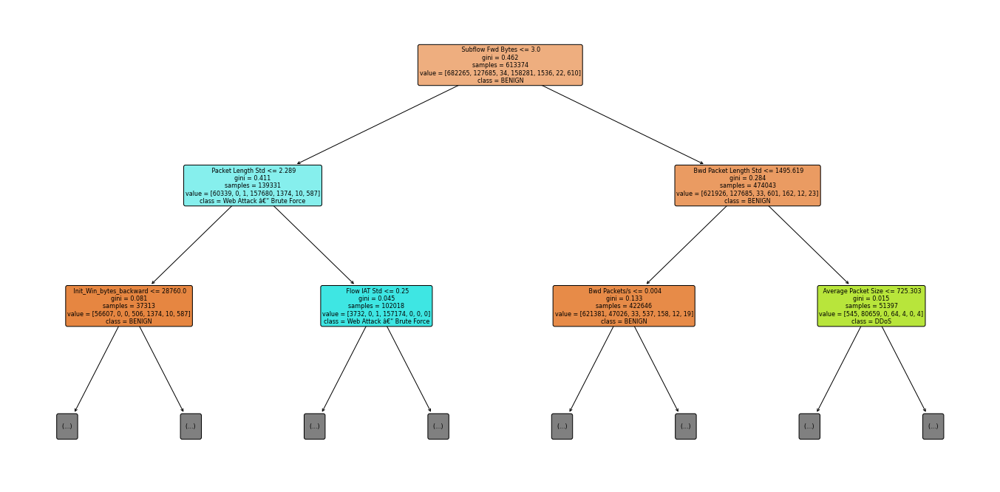

DecisionTreeClassifier(max_features='auto', random_state=253353400)


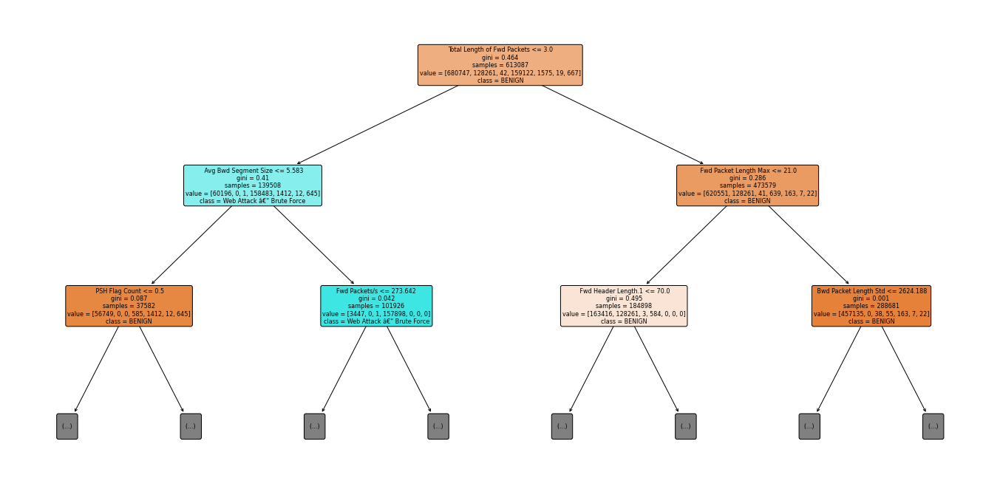

DecisionTreeClassifier(max_features='auto', random_state=1177480924)


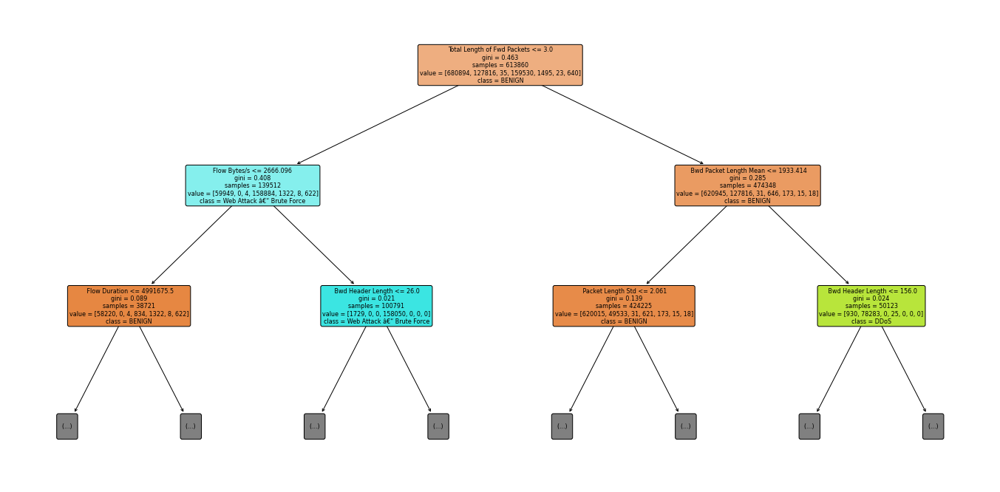

DecisionTreeClassifier(max_features='auto', random_state=2104336726)


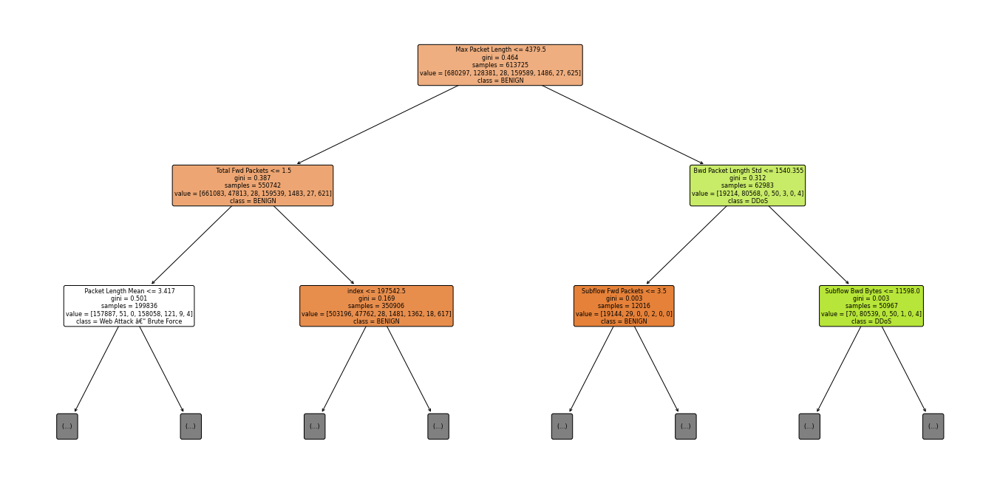

DecisionTreeClassifier(max_features='auto', random_state=560284980)


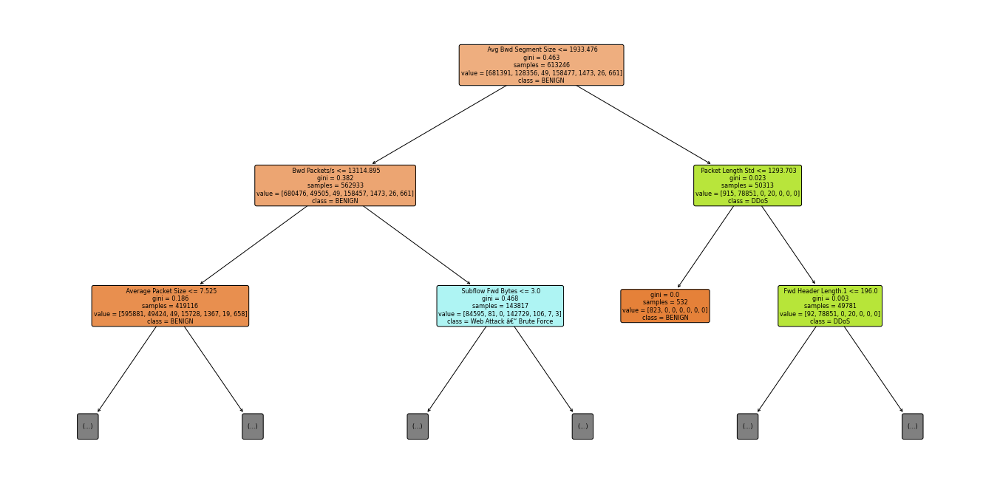

DecisionTreeClassifier(max_features='auto', random_state=2019079728)


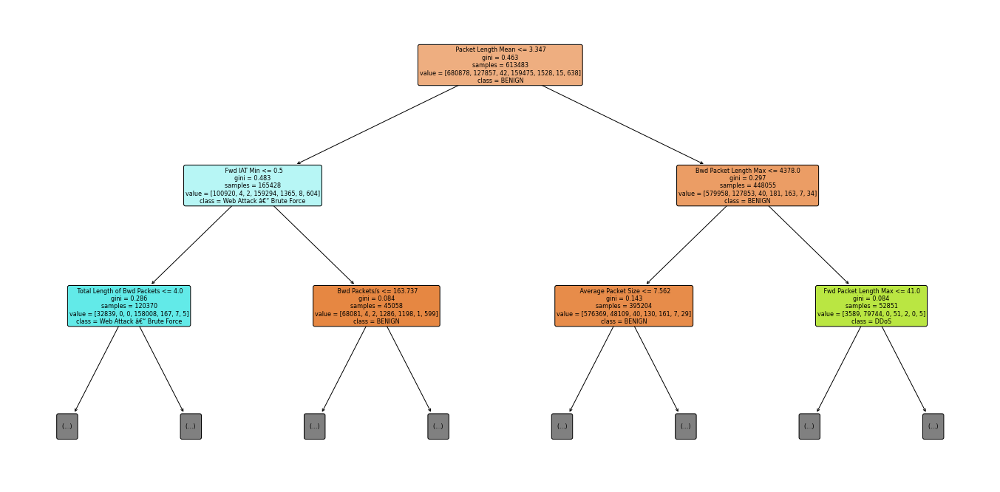

DecisionTreeClassifier(max_features='auto', random_state=1464889440)


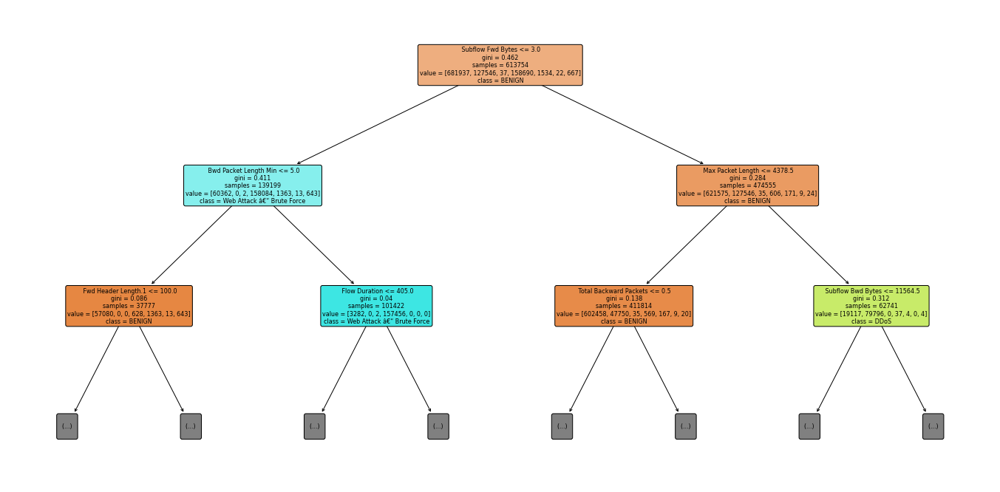

DecisionTreeClassifier(max_features='auto', random_state=1936758637)


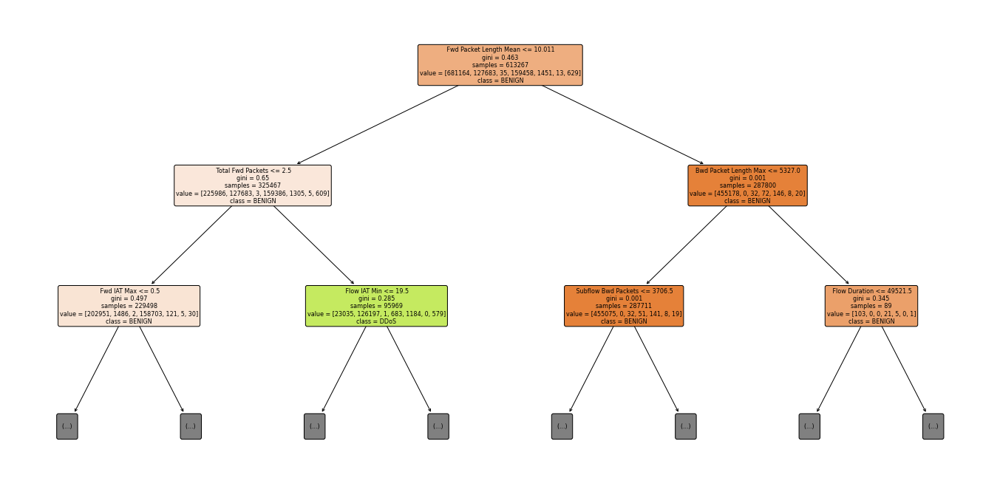

DecisionTreeClassifier(max_features='auto', random_state=1796091494)


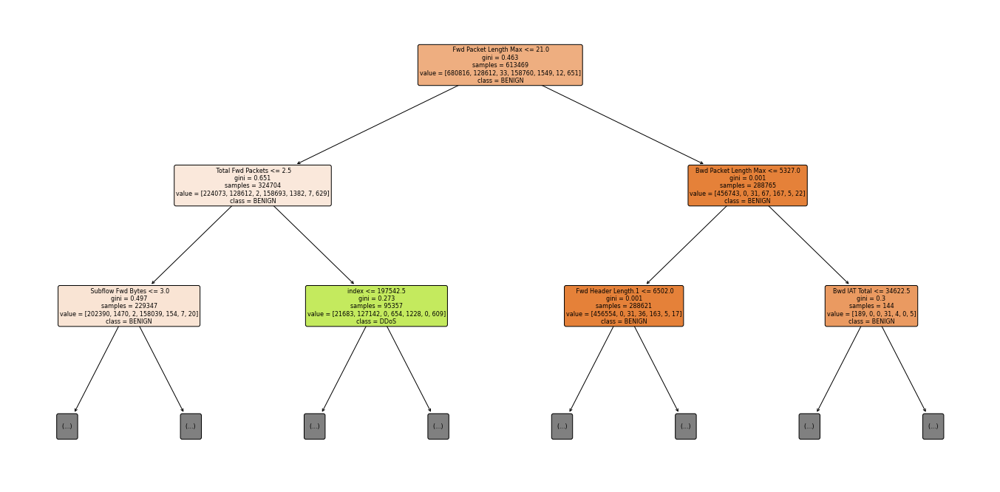

DecisionTreeClassifier(max_features='auto', random_state=1968414446)


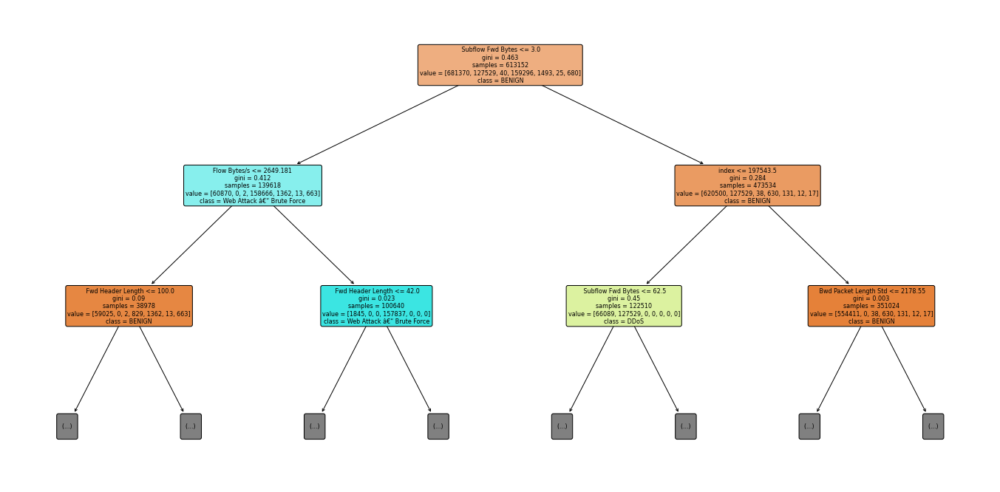

DecisionTreeClassifier(max_features='auto', random_state=1307133842)


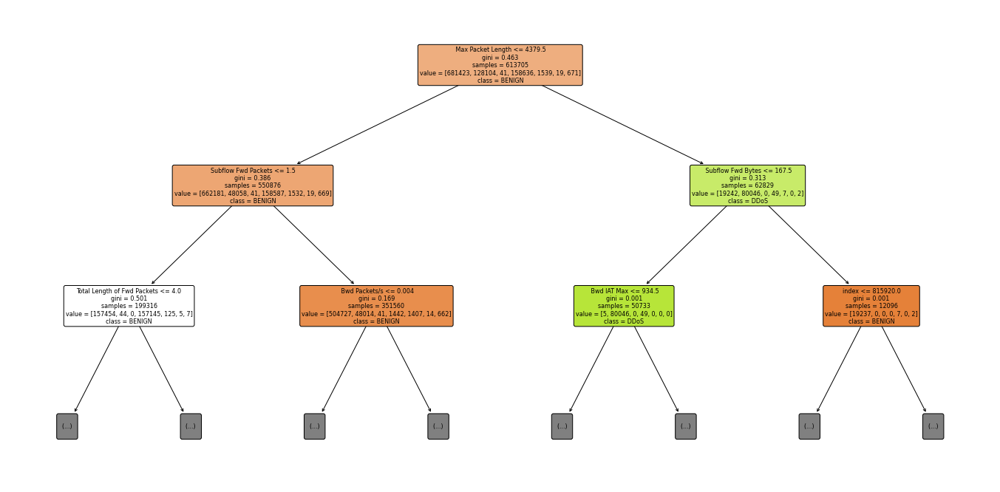

DecisionTreeClassifier(max_features='auto', random_state=1167905380)


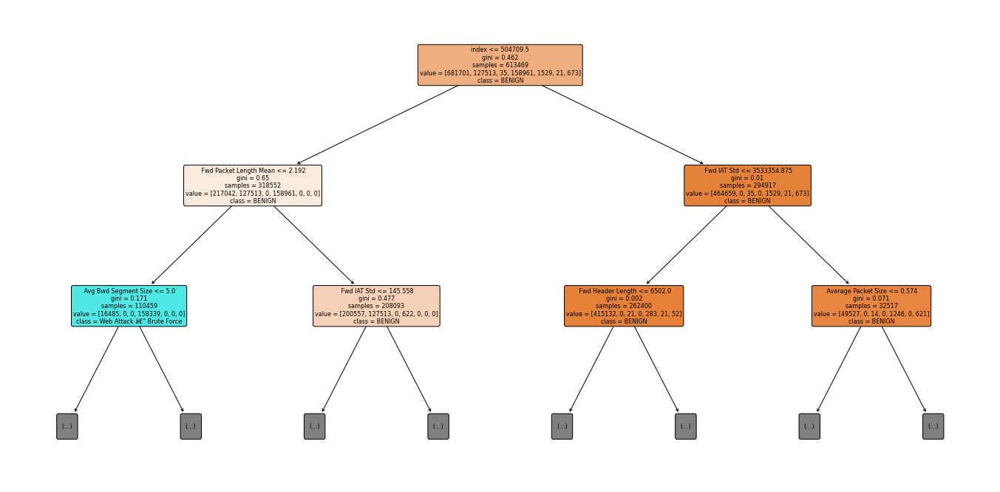

DecisionTreeClassifier(max_features='auto', random_state=931873349)


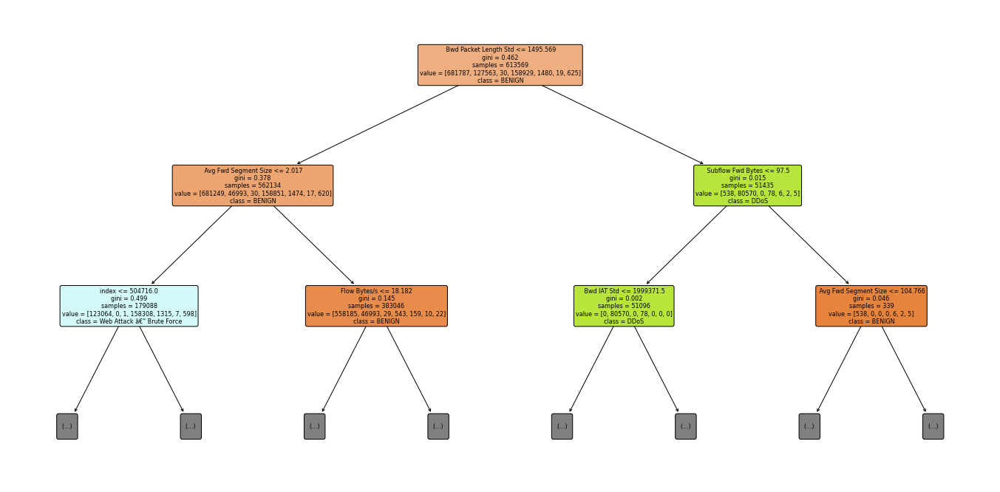

DecisionTreeClassifier(max_features='auto', random_state=2055238383)


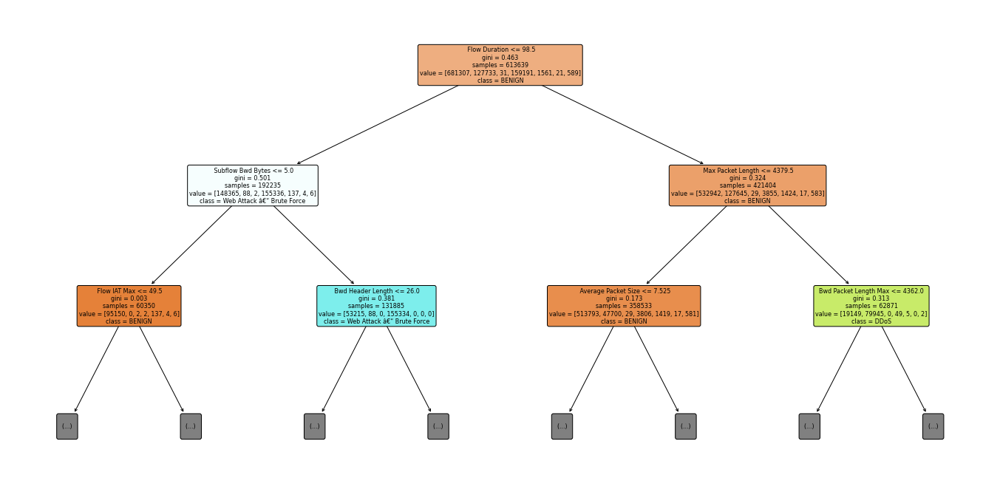

DecisionTreeClassifier(max_features='auto', random_state=1397185218)


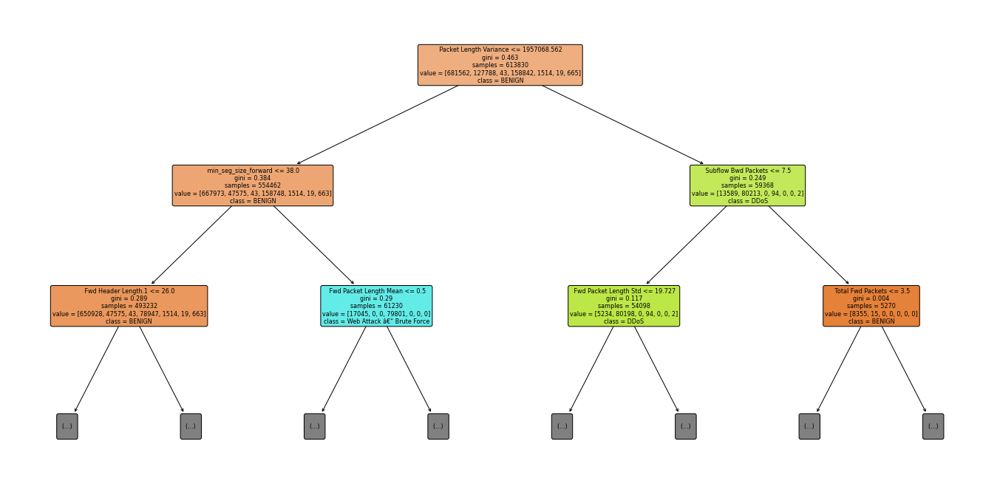

DecisionTreeClassifier(max_features='auto', random_state=1637545527)


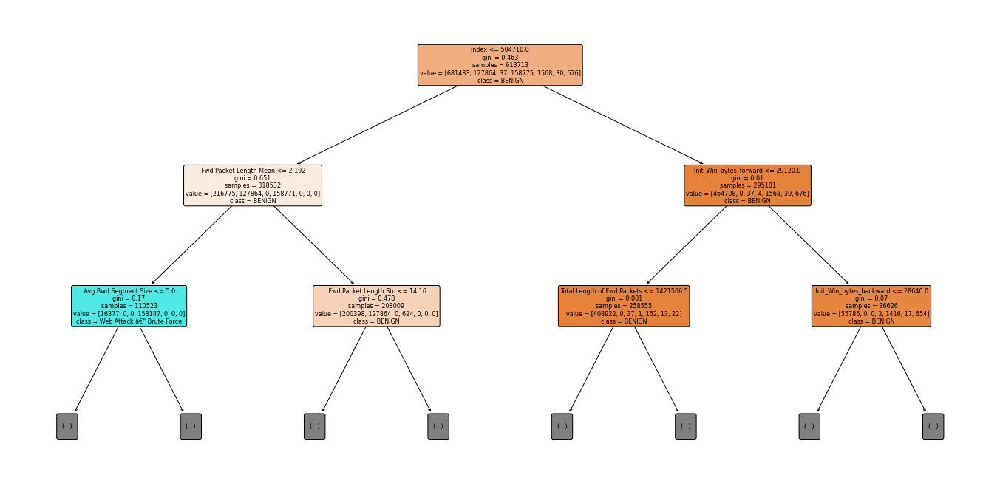

DecisionTreeClassifier(max_features='auto', random_state=1450388438)


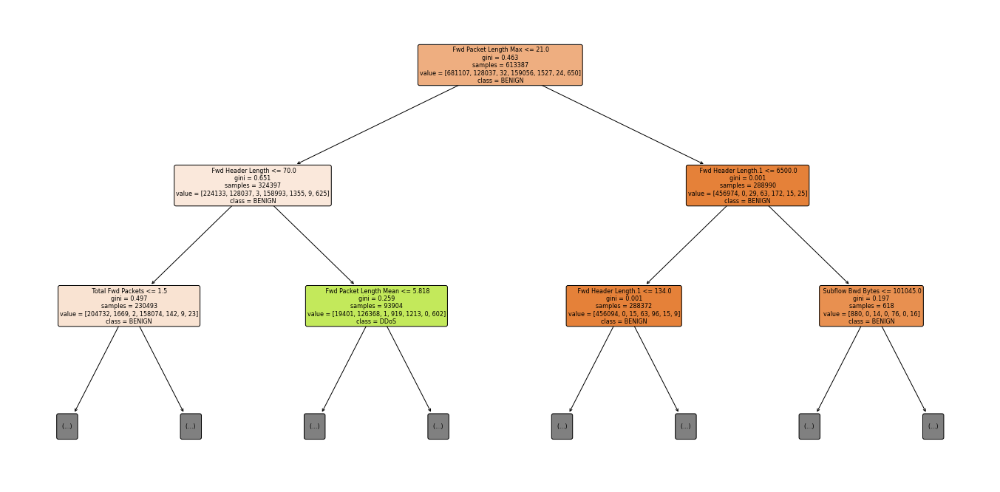

DecisionTreeClassifier(max_features='auto', random_state=2144092440)


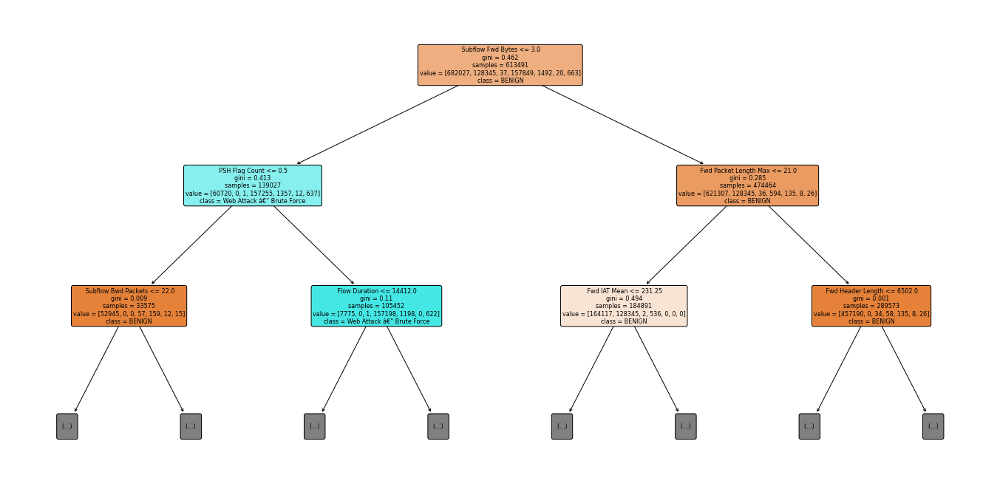

DecisionTreeClassifier(max_features='auto', random_state=559851586)


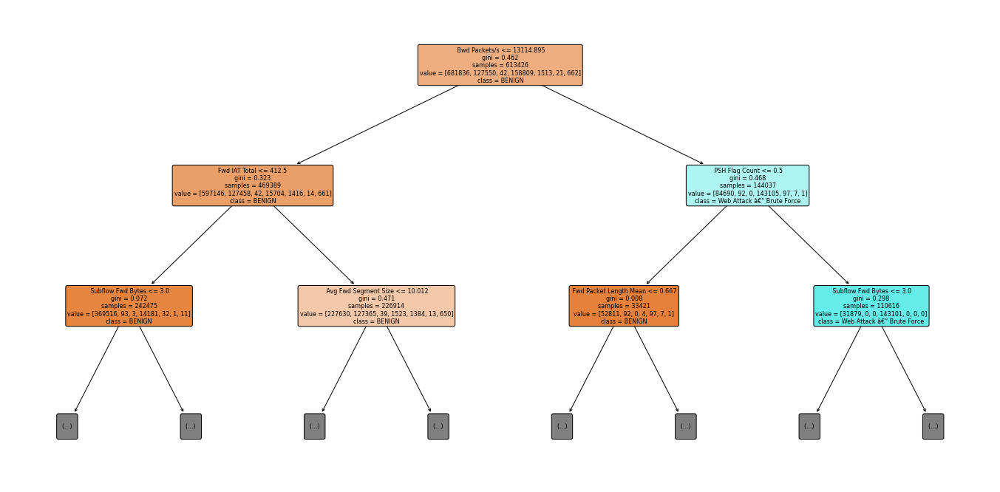

DecisionTreeClassifier(max_features='auto', random_state=4268810)


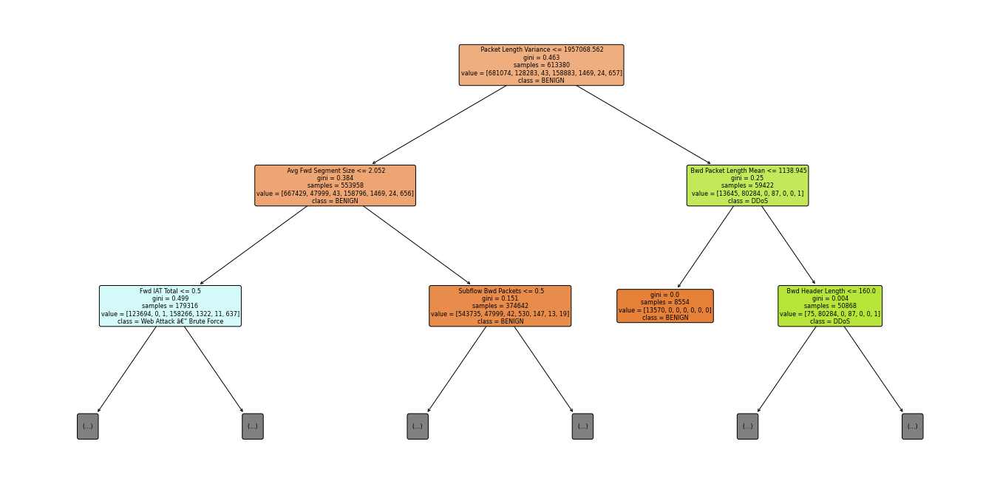

DecisionTreeClassifier(max_features='auto', random_state=989386229)


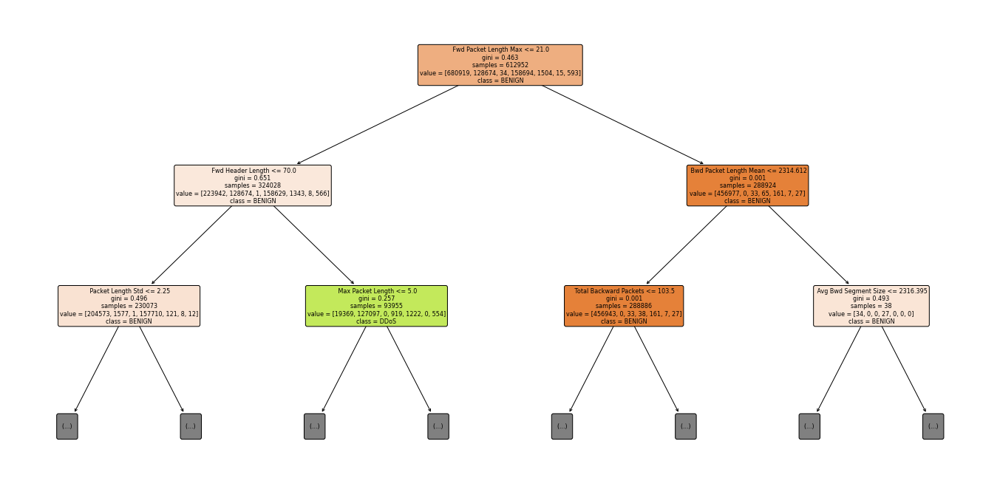

DecisionTreeClassifier(max_features='auto', random_state=1233148160)


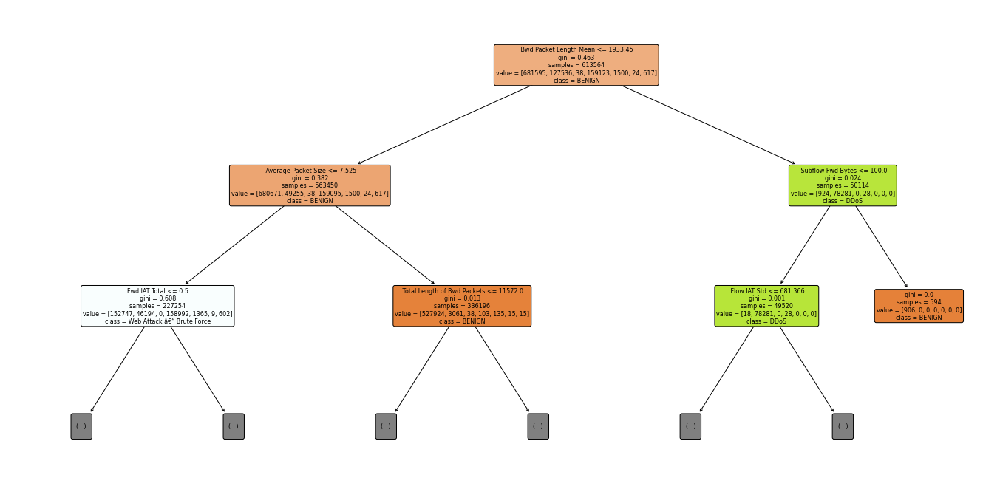

DecisionTreeClassifier(max_features='auto', random_state=141640443)


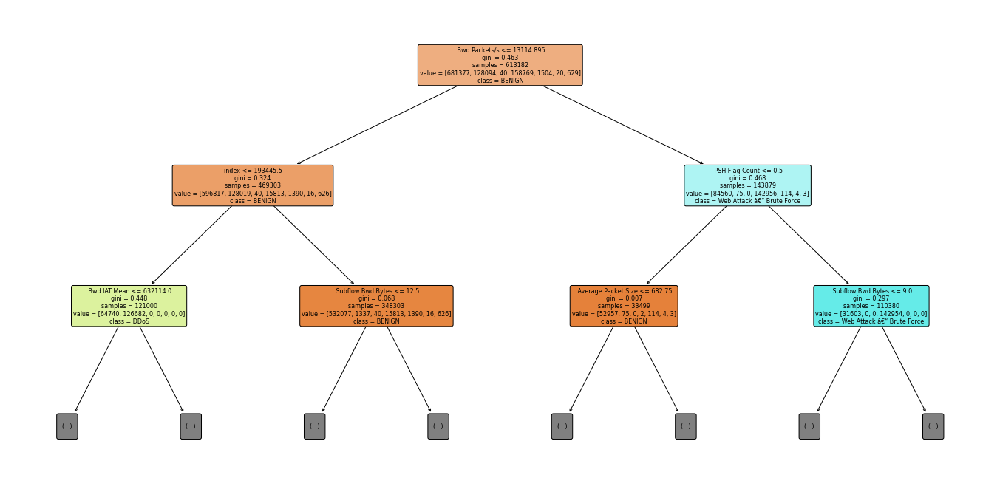

DecisionTreeClassifier(max_features='auto', random_state=329688083)


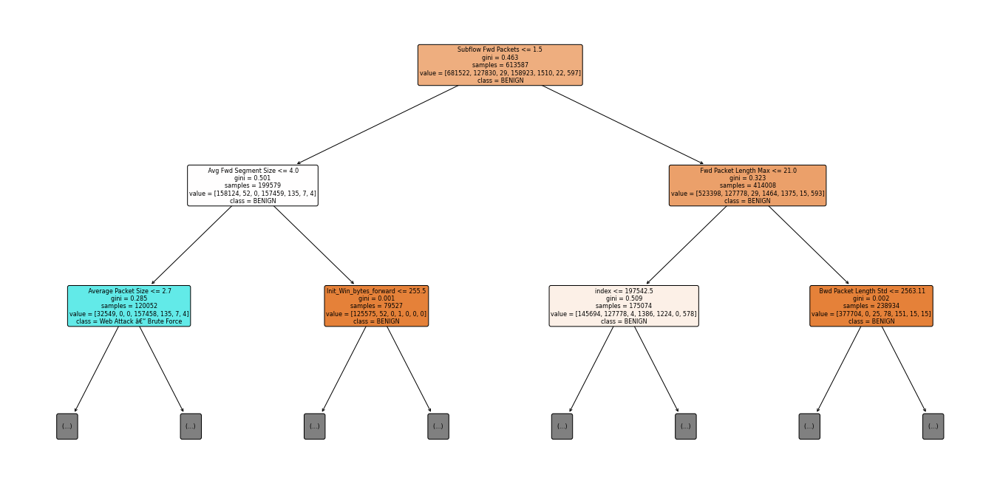

DecisionTreeClassifier(max_features='auto', random_state=1452798473)


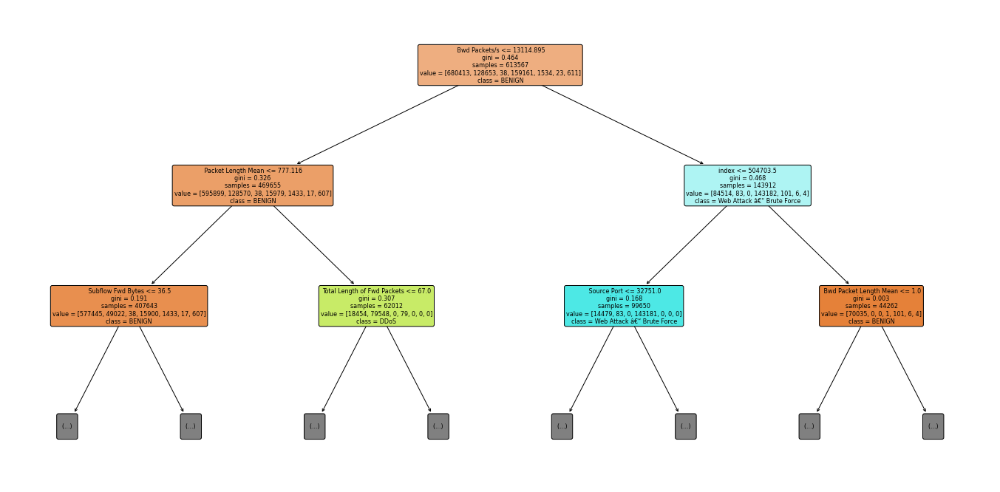

DecisionTreeClassifier(max_features='auto', random_state=680524630)


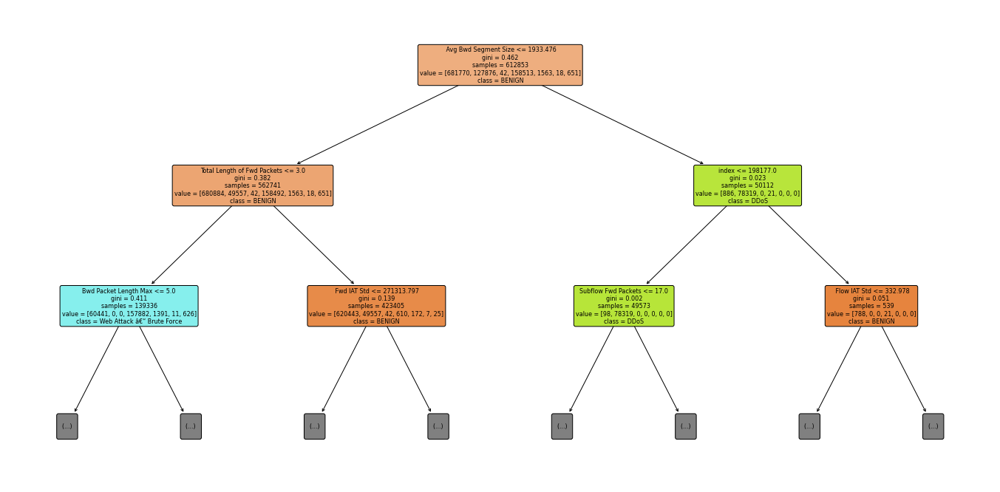

DecisionTreeClassifier(max_features='auto', random_state=524829615)


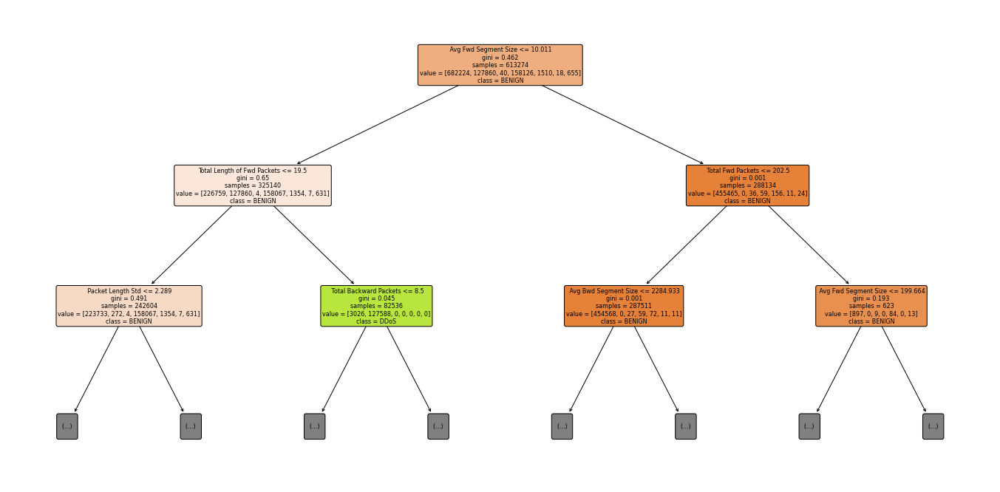

DecisionTreeClassifier(max_features='auto', random_state=1903721408)


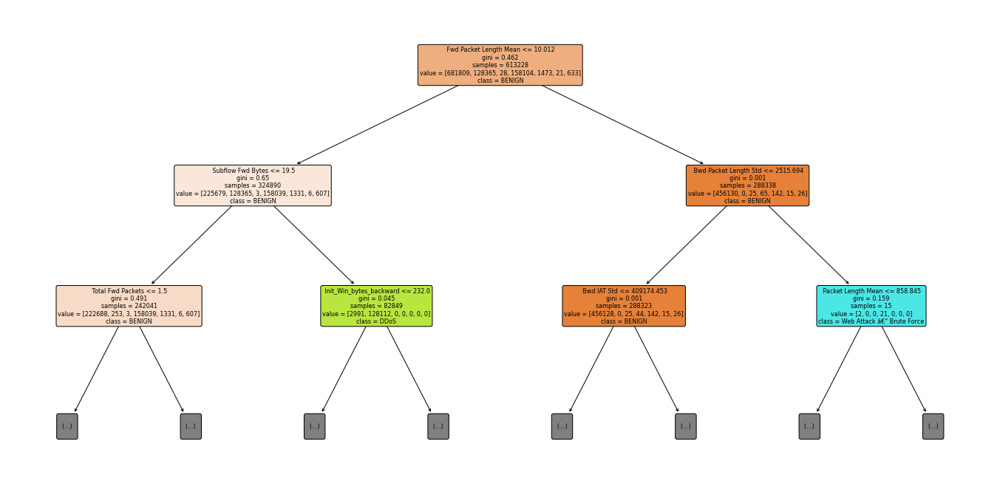

DecisionTreeClassifier(max_features='auto', random_state=679574493)


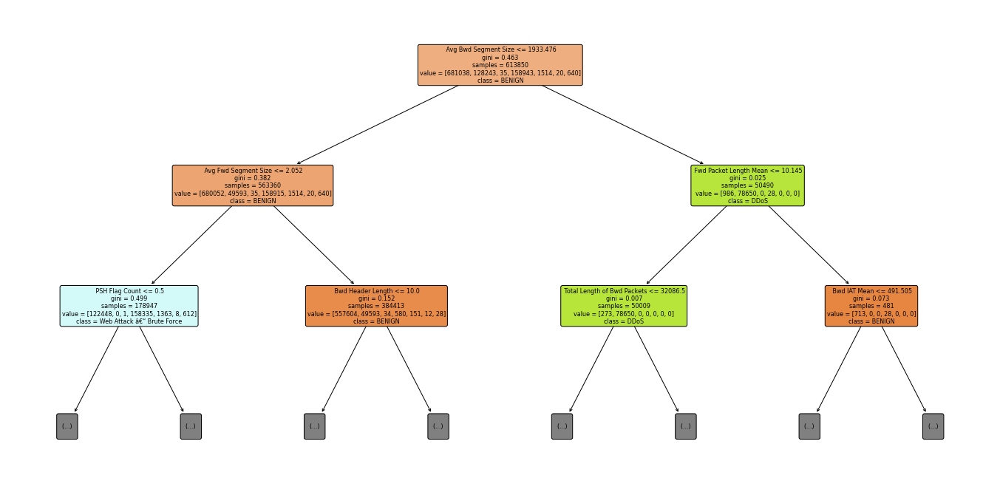

DecisionTreeClassifier(max_features='auto', random_state=327030976)


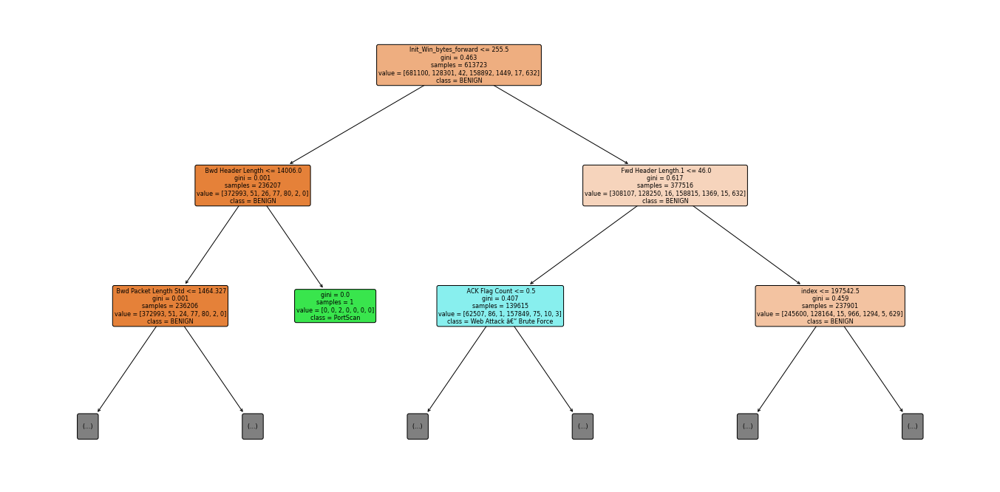

DecisionTreeClassifier(max_features='auto', random_state=903279749)


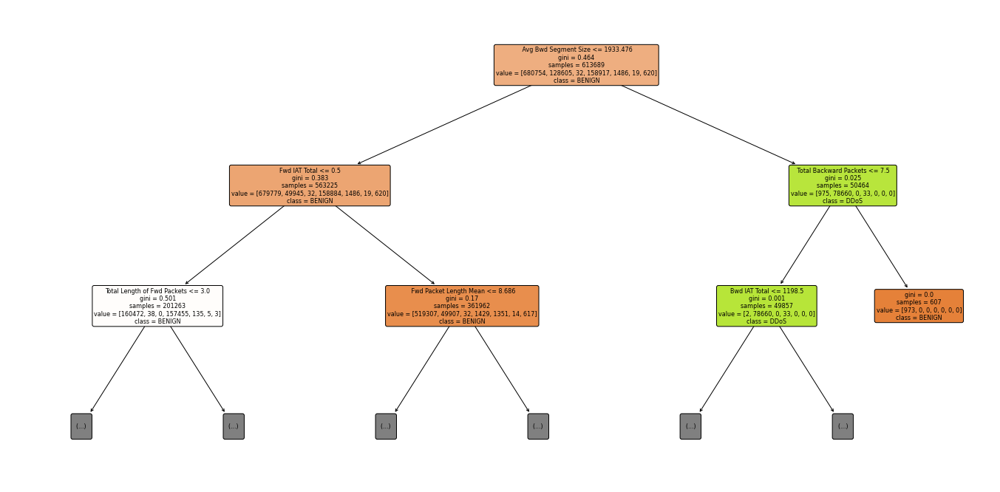

DecisionTreeClassifier(max_features='auto', random_state=722264664)


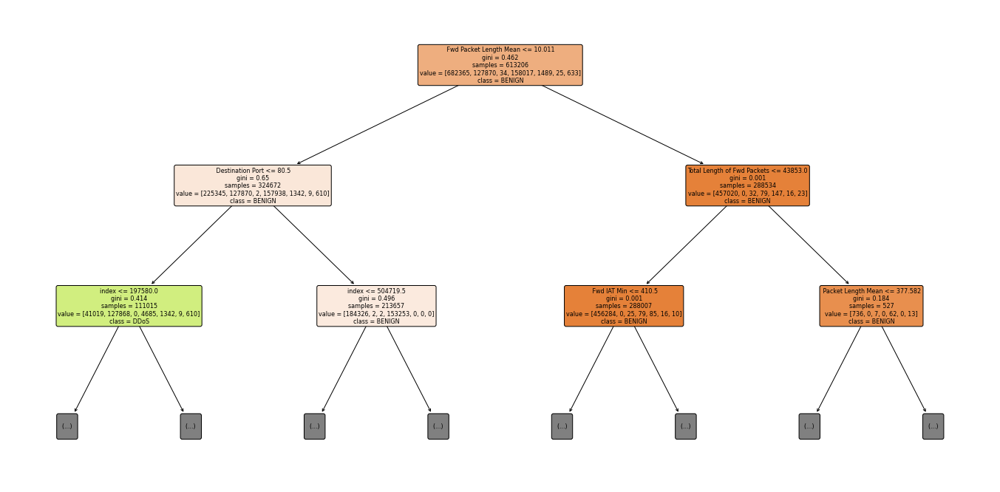

DecisionTreeClassifier(max_features='auto', random_state=1041983148)


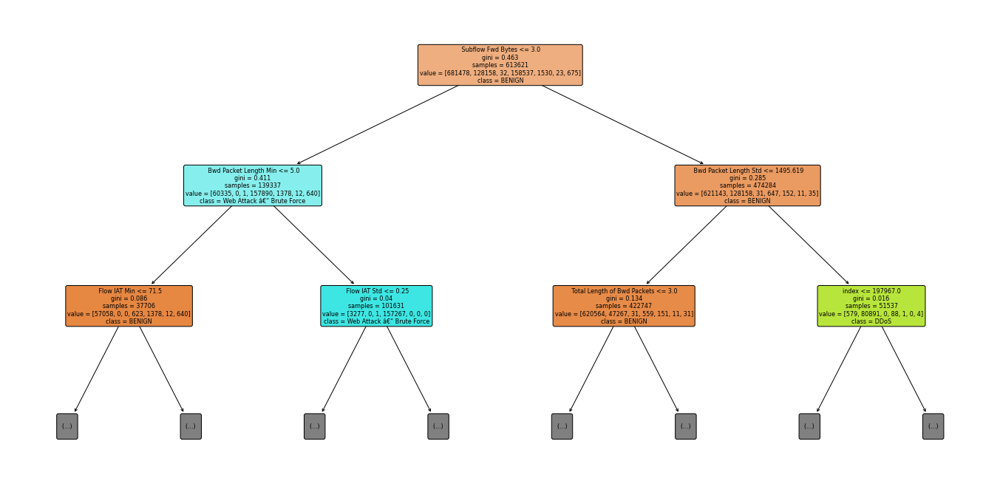

In [35]:
# Grafik decision tree
features = data2.columns.values

for estimator in model.estimators_:
    print(estimator)
    plt.figure(figsize=(24,12))
    tree.plot_tree(estimator,
                   feature_names=features,
                   class_names=y.unique(),
                   fontsize=8,
                   max_depth=2, 
                   filled=True, 
                   rounded=True)
    plt.show()

In [ ]:
import matplotlib
import sklearn

print(pd.__version__)
print(np.__version__)
print(matplotlib.__version__)
print(sklearn.__version__)

1.5.3
1.22.4
0.12.2
3.7.1
1.2.2


In [ ]:
!python --version

Python 3.10.11
